# Data import

In [46]:
import scanpy as sc
import pandas as pd
adata = sc.read_h5ad('/home/Data_Drive_8TB_2/Coloncancer/KRAS_project/Cellbender_KRAS_RE/crc_36_patients_celltype_annotation_260121.h5ad')

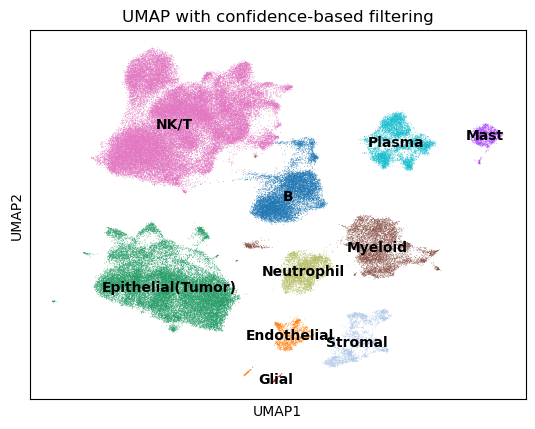

In [47]:
sc.pl.umap(
    adata,
    color='cell_type',
    title='UMAP with confidence-based filtering',
    legend_loc='on data')

In [48]:
adata = adata.raw.to_adata()

In [49]:
adata.obs['cell_type'] = adata.obs['cell_type'].astype(str)

myeloid = adata[adata.obs['cell_type'].isin(['Neutrophil','Myeloid'])].copy()

In [50]:
myeloid.write("/home/Data_Drive_8TB/kykim/5. CRC (Myeloid)/Mye_raw_H5ad/myeoloid_raw_data.h5ad")

# Total Myeloid analysis

In [51]:
import scanpy as sc
adata = sc.read_h5ad("/home/Data_Drive_8TB/kykim/5. CRC (Myeloid)/Mye_raw_H5ad/myeoloid_raw_data.h5ad")

In [52]:
adata.layers['counts'] = adata.X.copy() 
sc.pp.normalize_total(adata,target_sum=1e4) 
sc.pp.log1p(adata)
adata.raw = adata.copy()
adata.X.expm1().sum(axis = 1)

matrix([[10000.],
        [10000.],
        [10000.],
        ...,
        [10000.],
        [10000.],
        [10000.]])

In [53]:
adata.layers['normalize'] = adata.X.copy()

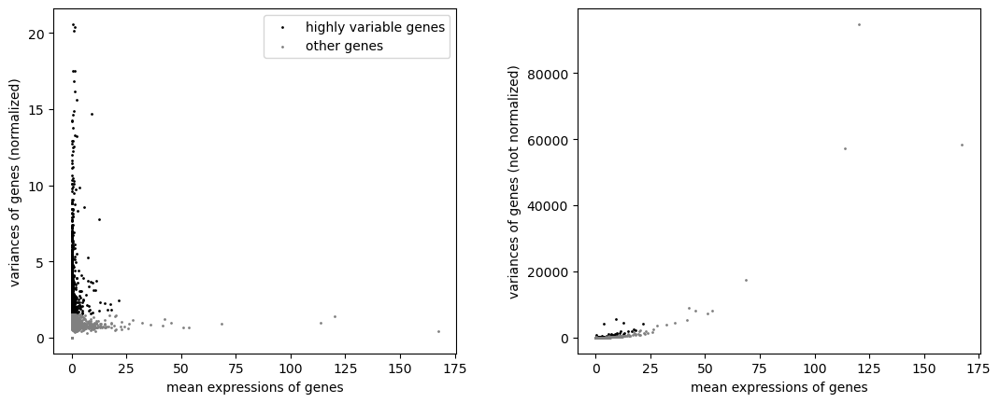

In [54]:
sc.pp.highly_variable_genes(adata, flavor='seurat_v3',layer='counts',n_top_genes=2000)
sc.pl.highly_variable_genes(adata)

In [55]:
adata = adata[:, adata.var.highly_variable].copy()

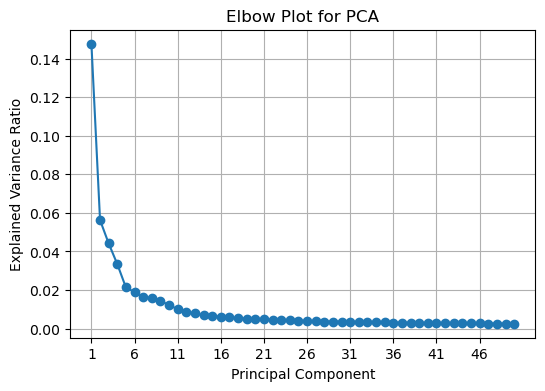

In [56]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

sc.tl.pca(adata)
explained_variance_ratio = adata.uns["pca"]["variance_ratio"]

plt.figure(figsize=(6, 4))
plt.plot(range(1, len(explained_variance_ratio) + 1), explained_variance_ratio, marker="o", linestyle="-")
plt.xlabel("Principal Component")
plt.ylabel("Explained Variance Ratio")
plt.title("Elbow Plot for PCA")
plt.xticks(np.arange(1, len(explained_variance_ratio) + 1, step=5))
plt.grid()
plt.show()

In [57]:
sc.tl.pca(adata, n_comps=6, svd_solver='arpack')

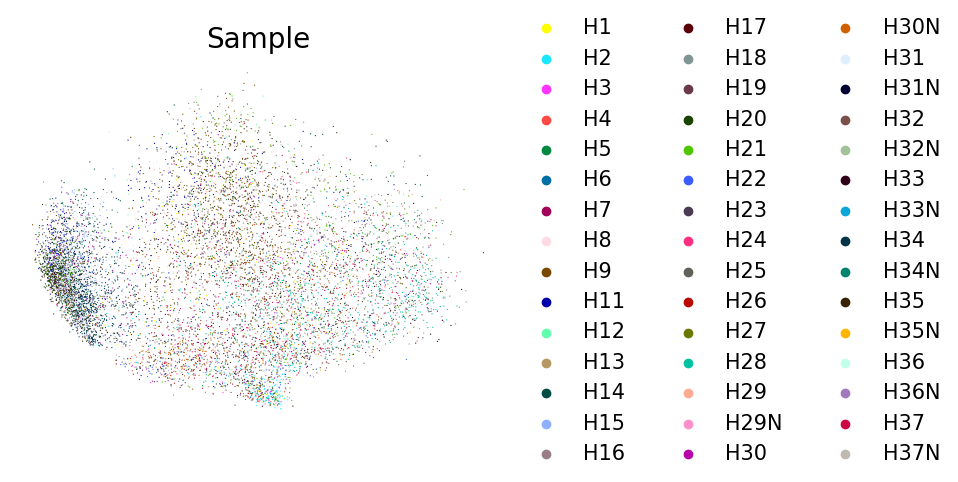

In [58]:
sc.pl.pca(
    adata,
    color=['sample'],
    frameon=False,
    size= 3,
    legend_fontsize=15,
    legend_fontoutline=3,
    title="CluVar UMAP",
    show=False)
plt.title("Sample", fontsize=20)
sc.pp.neighbors(adata)
adata.X = adata.X.astype(np.float32)
sc.tl.pca(adata, svd_solver="arpack", n_comps=50)
sc.pp.neighbors(adata, use_rep="X_pca", n_neighbors=15, n_pcs=50)
sc.tl.umap(adata)

Text(0.5, 1.0, 'Sample')

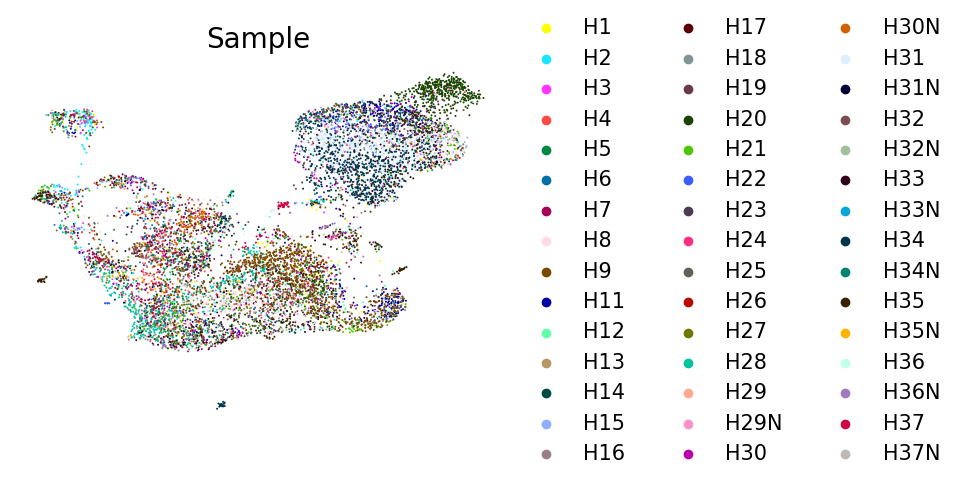

In [59]:
sc.pl.umap(
    adata,
    color=['sample'],
    frameon=False,
    size= 8,
    legend_fontsize=15,
    legend_fontoutline=3,
    title="Sample",
    show=False)

plt.title("Sample", fontsize=20)

In [60]:
import scvi 

scvi.model.SCVI.setup_anndata(adata, layer="counts", batch_key="sample")
vae = scvi.model.SCVI(adata, n_layers=2, n_latent=30, gene_likelihood="nb")

vae.train(max_epochs=400, early_stopping=True, early_stopping_patience=10)

/home/Data_Drive_8TB/kykim/.conda/envs/kykim/lib/python3.9/site-packages/scvi/data/fields/_dataframe_field.py:186: UserWarning: Category 36 in adata.obs['_scvi_batch'] has fewer than 3 cells. Models may not train properly.
  categorical_mapping = _make_column_categorical(
Trainer will use only 1 of 2 GPUs because it is running inside an interactive / notebook environment. You may try to set `Trainer(devices=2)` but please note that multi-GPU inside interactive / notebook environments is considered experimental and unstable. Your mileage may vary.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1]
/home/Data_Drive_8TB/kykim/.conda/envs/kykim/lib/python3.9/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=63` in the `DataLoader` to improve p

Epoch 178/400:  44%|████▍     | 178/400 [02:31<03:08,  1.18it/s, v_num=1, train_loss_step=339, train_loss_epoch=406]
Monitored metric elbo_validation did not improve in the last 10 records. Best score: 446.458. Signaling Trainer to stop.


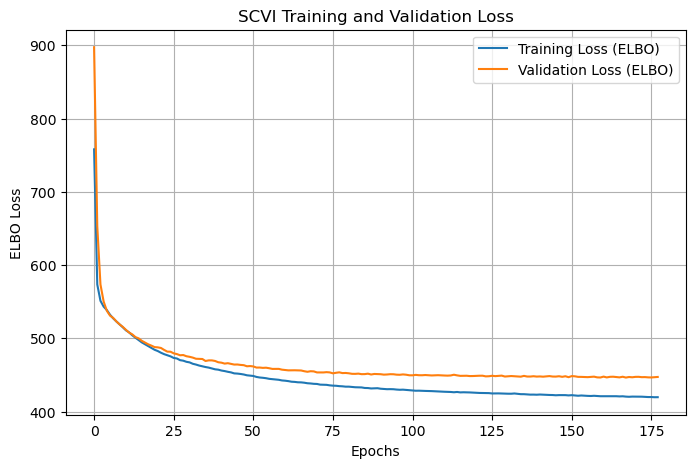

In [61]:
import matplotlib.pyplot as plt

train_loss = vae.history["elbo_train"]
val_loss = vae.history["elbo_validation"]
plt.figure(figsize=(8, 5))
plt.plot(train_loss, label="Training Loss (ELBO)")
plt.plot(val_loss, label="Validation Loss (ELBO)")
plt.xlabel("Epochs")
plt.ylabel("ELBO Loss")
plt.title("SCVI Training and Validation Loss")
plt.legend()
plt.grid()
plt.show()

Text(0.5, 1.0, 'scVI')

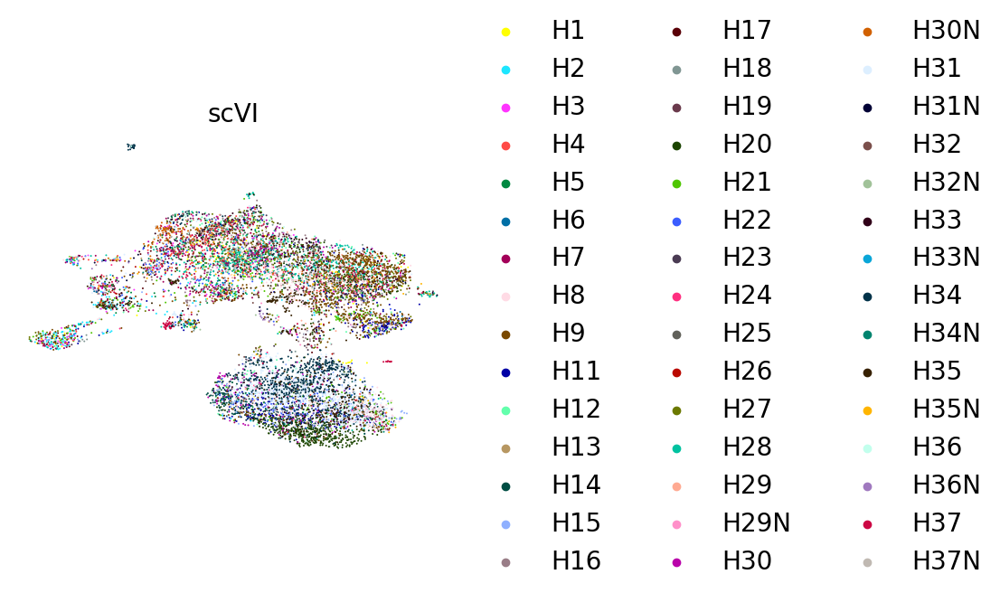

In [62]:
adata.obsm["X_scVI"] = vae.get_latent_representation()
sc.pp.neighbors(adata, use_rep = 'X_scVI')
sc.tl.umap(adata)
sc.pl.umap(
    adata,
    color=['sample'],
    frameon=False,
    size= 8,
    legend_fontsize=20,
    legend_fontoutline=3,
    title="Sample",
    show=False)

plt.title("scVI", fontsize=20)

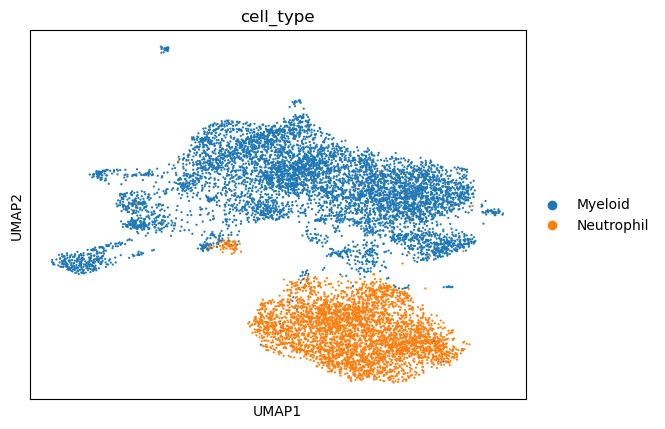

In [63]:
sc.pl.umap(
    adata,
    color="cell_type",
    size=10,
)

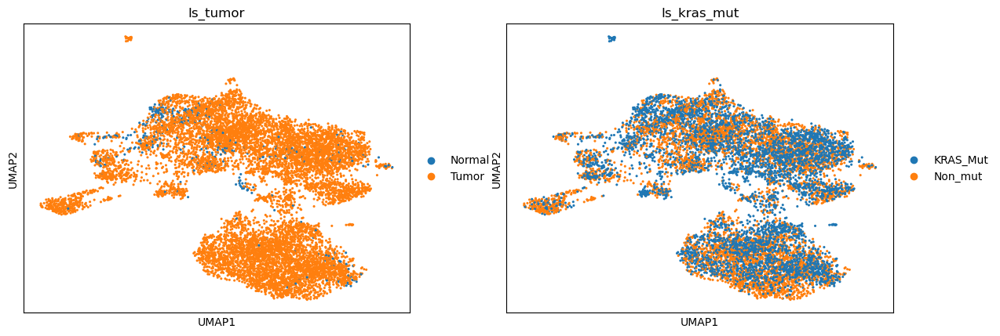

In [64]:
adata.obs['Is_tumor'] = adata.obs['sample'].astype(str).str.contains('N', regex=False).map(
    {True: 'Normal', False: 'Tumor'})
adata.obs['Is_kras_mut'] = (adata.obs['KRAS'] == '-').map({True: 'Non_mut', False: 'KRAS_Mut'})

sc.pl.umap(
    adata,
    color=["Is_tumor","Is_kras_mut"],
    size=20)

In [65]:
for res in [0.50, 0.75, 1,1.25]:
    sc.tl.leiden(
        adata, key_added=f"leiden_res_{res:4.2f}", resolution=res, flavor="igraph"
    )

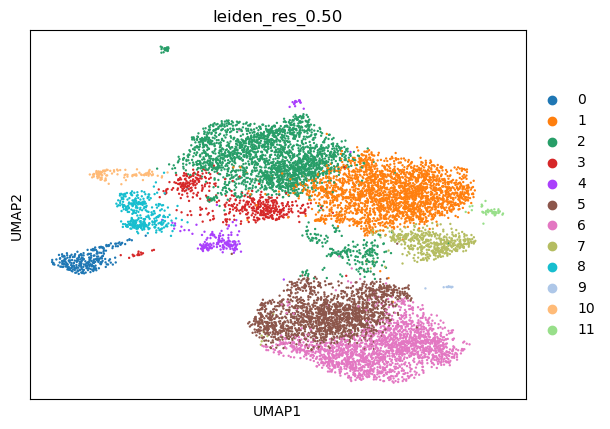

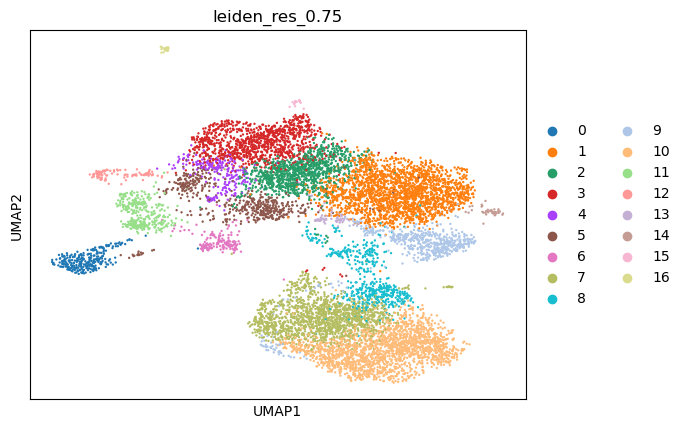

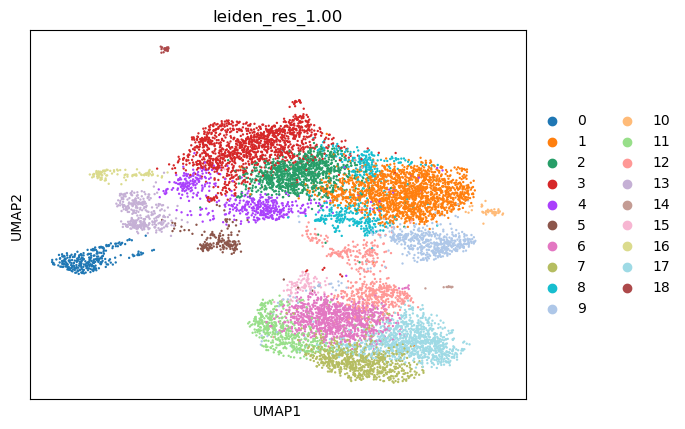

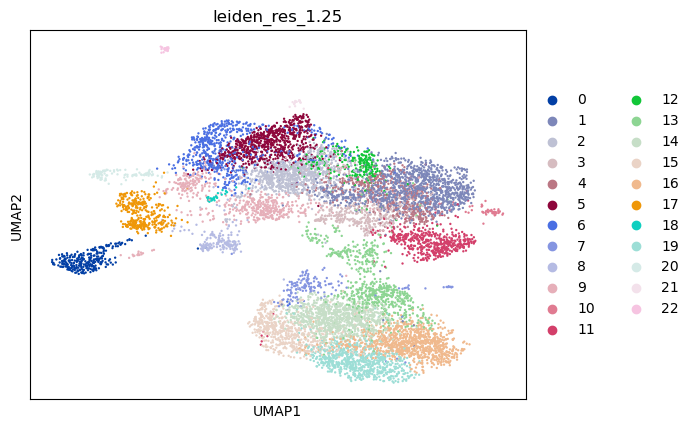

In [66]:
sc.pl.umap(adata, color=["leiden_res_0.50"])
sc.pl.umap(adata, color=["leiden_res_0.75"])
sc.pl.umap(adata, color=["leiden_res_1.00"])
sc.pl.umap(adata, color=["leiden_res_1.25"])

In [67]:
adata = adata.raw.to_adata()

In [68]:
adata.raw = adata.copy()

Cluster 0: ['SEC61B', 'EZR', 'GPR183', 'IRF4', 'CD74', 'GZMB', 'PABPC1', 'CXCR4', 'LDLRAD4', 'IL3RA', 'AKAP13', 'PTMA', 'NR4A3', 'SEL1L3', 'HSP90B1', 'P2RY6', 'NR3C1', 'APP', 'TSPAN13', 'TCF4']
Cluster 1: ['S100A4', 'TIMP1', 'RPLP1', 'LYZ', 'RPL28', 'RPL32', 'RPS24', 'RPLP2', 'RPS14', 'CST3', 'S100A10', 'RPS8', 'RPS13', 'RPS16', 'RPL34', 'RPL8', 'RPL19', 'RPL11', 'RPS12', 'RPL30']
Cluster 2: ['CTSB', 'C1QA', 'CD74', 'C1QC', 'C1QB', 'HLA-DRB1', 'PSAP', 'GPX1', 'HLA-DRA', 'HLA-DPA1', 'CST3', 'NPC2', 'CTSD', 'HLA-DPB1', 'CD68', 'HLA-DMA', 'GRN', 'TMEM176B', 'CTSZ', 'MS4A6A']
Cluster 3: ['FTL', 'TMSB10', 'GPX1', 'TMSB4X', 'C1QC', 'EEF1A1', 'C1QB', 'C1QA', 'RPLP1', 'PPIA', 'CD74', 'CTSD', 'GAPDH', 'LGALS1', 'PRDX1', 'RPL41', 'CD68', 'HLA-DPB1', 'RPS19', 'RPL10']
Cluster 4: ['HLA-DPB1', 'CD74', 'HLA-DRA', 'HLA-DPA1', 'EEF1A1', 'RPS19', 'RPL10', 'RPS14', 'RPS23', 'RPL13', 'RPS24', 'RPS3A', 'RPL32', 'RPL28', 'RPS27A', 'RPS18', 'RPS8', 'RPL19', 'RPL26', 'TMSB10']
Cluster 5: ['RPLP1', 'MT-CO1', 

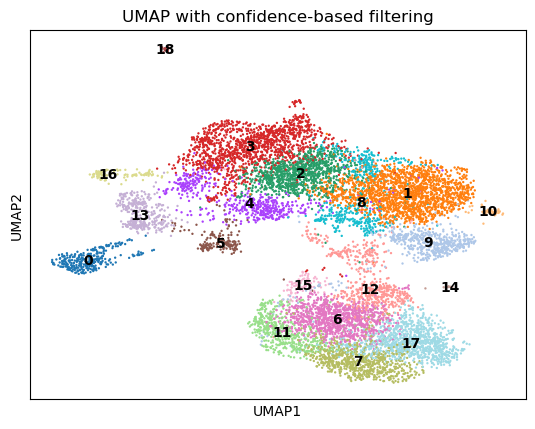

In [79]:
import scanpy as sc
adata.obs['leiden_res_1.00'] = adata.obs['leiden_res_1.00'].astype('category')
sc.tl.rank_genes_groups(adata, groupby='leiden_res_1.00', method='t-test')

top_genes = {}

groups = adata.uns['rank_genes_groups']['names'].dtype.names

for group in groups:
    genes = adata.uns['rank_genes_groups']['names'][group][:20]
    top_genes[group] = genes.tolist()

for cluster, genes in top_genes.items():
    print(f"Cluster {cluster}: {genes}")
sc.pl.umap(
    adata,
    color='leiden_res_1.00',
    title='UMAP with confidence-based filtering',
    legend_loc='on data')

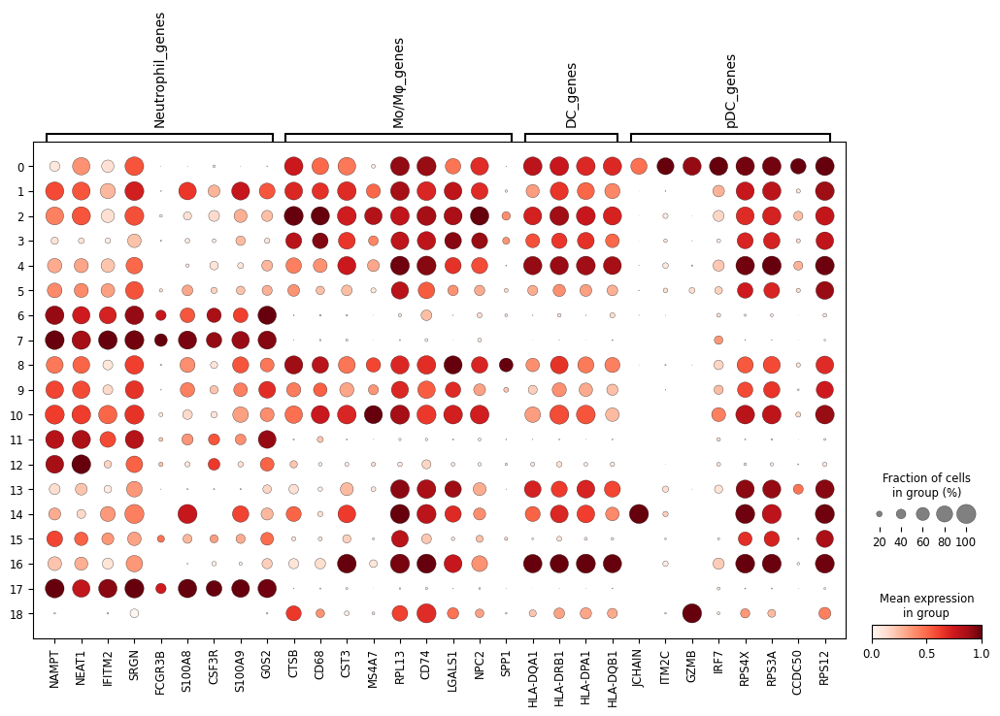

In [81]:
import scanpy as sc

group_markers = {
    "Neutrophil_genes": [
        'NAMPT','NEAT1','IFITM2', 'SRGN','PTRPC', 'FCGR3B', 'S100A8', 'CSF3R', 'S100A9', 'G0S2'],
    "Mo/Mφ_genes": [
        'CTSB','CD68','CST3','MS4A7','RPL13','CD74','LGALS1','NPC2','SPP1'],
    "DC_genes": [
        'HLA-DQA1', 'HLA-DRB1', 'HLA-DPA1', 'HLA-DQB1'],
    "pDC_genes": [
        'JCHAIN','ITM2C','GZMB','IRF7','LILA4','RPS4X','RPS3A','CCDC50','RPS12'
    ]}

existing_genes = {cat: [gene for gene in genes if gene in adata.var_names] 
                  for cat, genes in group_markers.items()}
existing_genes = {cat: genes for cat, genes in existing_genes.items() if genes}
sc.pl.dotplot(adata, var_names=existing_genes, groupby="leiden_res_1.00", standard_scale="var")

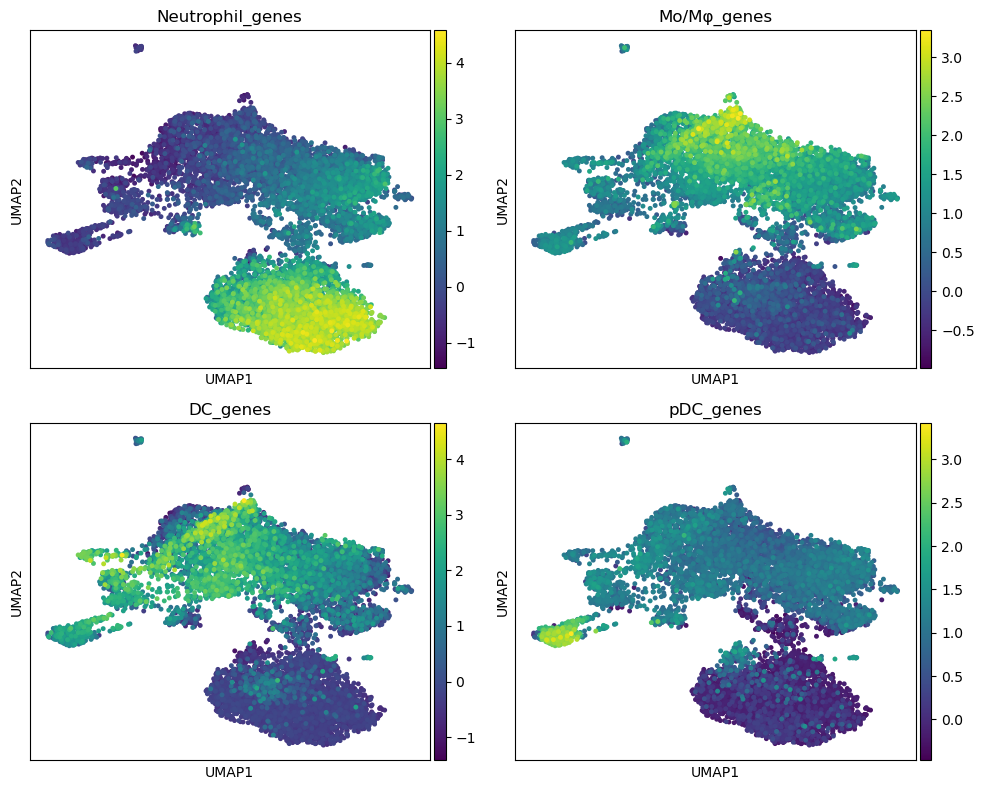

In [71]:
import scanpy as sc
import matplotlib.pyplot as plt

for group_name, genes in group_markers.items():
    genes_existing = [g for g in genes if g in adata.var_names]
    if len(genes_existing) > 0:
        sc.tl.score_genes(
            adata,
            gene_list=genes_existing,
            score_name=group_name + "_score"
        )

group_names = list(group_markers.keys())[:4]

fig, axes = plt.subplots(2, 2, figsize=(10, 8))
axes = axes.flatten()

for ax, group_name in zip(axes, group_names):
    score_col = group_name + "_score"
    sc.pl.umap(
        adata,
        color=score_col,
        cmap="viridis",
        size=50,
        ax=ax,
        show=False
    )
    ax.set_title(group_name)

plt.tight_layout()
plt.show()

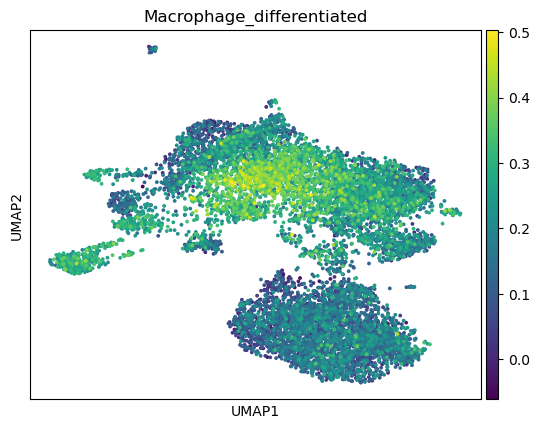

In [72]:
import scanpy as sc

gene_list = [
"TSPAN2","TRIB1","CEBPA","CEBPE","IL31RA","ARID3C","GAB3","ZBTB46","PARP1","CSF1",
"CSF1R","CSF2","IL34","NKX2-3","VPS13A","SIRT1","FOSL2","MFSD8","GATA2","GATA3",
"GBA1","EIF2AK1","NR3C1","HCLS1","HLA-DRB1","HSF1","ID2","CCDC39","IFNG","IGHE",
"APP","IL15","INHA","INHBA","NRROS","LIF","MIR145","MIR223","MMP9","MYD88",
"NAGLU","NDP","NPM1","TAOK3","VPS54","PF4","PRKCA","PTPN2","RB1","MIR486-1",
"BMP4","SPI1","SPIB","TGFB1","TLR2","TLR4","C1QC","UCP2","VEGFA","CALCA",
"DIAPH3","CASP8","L3MBTL3","SOCS1","RIPK1","FADD","CFLAR","IL33","IL1RL1","CD4",
"LARGE1","ADIPOQ","QKI","CDC42"
]

genes_use = [g for g in gene_list if g in adata.var_names]

sc.tl.score_genes(
    adata,
    gene_list=genes_use,
    score_name="Macrophage_differentiated",
    use_raw=False
)

sc.pl.umap(
    adata,
    color="Macrophage_differentiated", s = 30
)

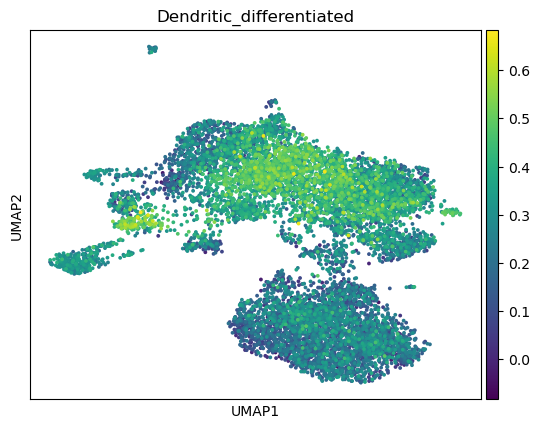

In [73]:
import scanpy as sc

gene_list = [
    "DHRS2","LILRB2","CEBPB","UBD","BATF","LILRB1","BATF2","CCR7","ZBTB46","CSF2",
    "CLEC12A","AGER","F2RL1","FCGR2B","FLT3","FLT3LG","GAS6","GATA1","TMEM176B",
    "HLA-B","HLA-G","HMGB1","IRF8","RBPJ","IL4","IRF4","ITGB6","ITGB8","LGALS1",
    "LGALS3","LGALS9","LTBR","LYN","MIR223","NOTCH2","TAOK3","TREM2","TMEM176A",
    "BATF3","AXL","PRTN3","PSEN1","RELB","CCL19","AZI2","SPI1","TGFB1","TGFBR2",
    "TRAF6","TRPM2","CAMK4","DCSTAMP"
]

genes_use = [g for g in gene_list if g in adata.var_names]

sc.tl.score_genes(
    adata,
    gene_list=genes_use,
    score_name="Dendritic_differentiated",
    use_raw=False
)

sc.pl.umap(
    adata,
    color="Dendritic_differentiated", s = 30
)

In [24]:
import scanpy as sc
adata = sc.read_h5ad("/home/Data_Drive_8TB/kykim/5. CRC (Myeloid)/Mye_raw_H5ad/total_after_clustering_data.h5ad")

In [27]:
import pandas as pd

save_path = "/home/Data_Drive_8TB/kykim/5. CRC (Myeloid)/Mye_raw_H5ad/large_anno.csv"

pd.DataFrame(adata.obs["myeloid_subtype"]).to_csv(save_path, index=True)

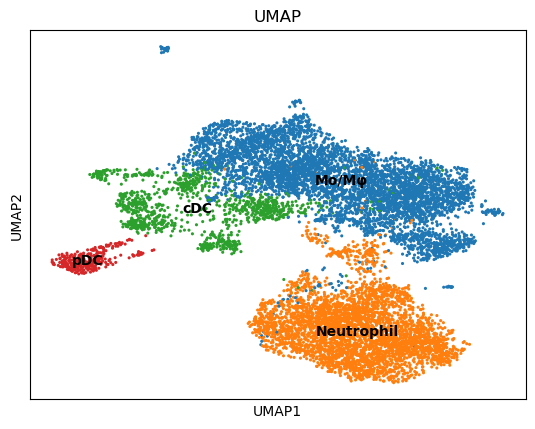

In [166]:
cluster_to_group = {
    0: "pDC",      
    1: "Mo/Mφ",        
    2: "Mo/Mφ",          
    3: "Mo/Mφ",     
    4: "cDC",    
    5: "cDC",    
    6: "Neutrophil",         
    7: "Neutrophil",     
    8: "Mo/Mφ",
    9: "Mo/Mφ",
    10: "Mo/Mφ",    
    11: "Neutrophil",
    12: "Neutrophil",    
    13: "cDC",         
    14: "Mo/Mφ",     
    15: "Neutrophil",
    16: "cDC",
    17: "Neutrophil",    
    18: "Mo/Mφ"}


adata.obs["myeloid_subtype"] = adata.obs["leiden_res_1.00"].astype(int).map(cluster_to_group)
sc.pl.umap(
    adata,
    color='myeloid_subtype',
    title='UMAP',
    legend_loc='on data'
    , s = 20
)

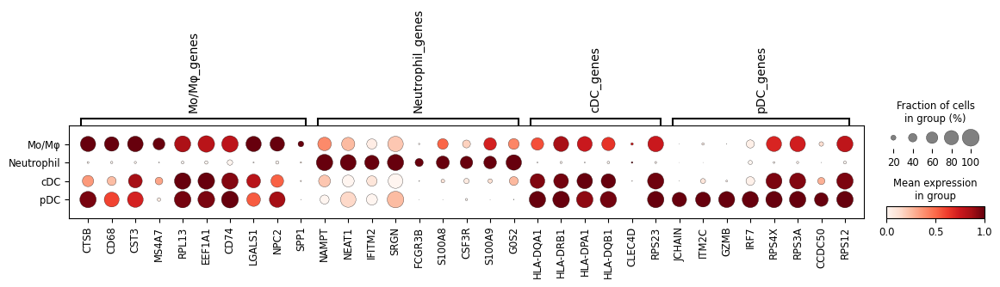

In [167]:
import scanpy as sc

group_markers = {
    "Mo/Mφ_genes": [
        'CTSB','CD68','CST3','MS4A7','RPL13','EEF1A1','CD74','LGALS1','NPC2','SPP1'],
    "Neutrophil_genes": [
        'NAMPT','NEAT1','IFITM2', 'SRGN','PTRPC', 'FCGR3B', 'S100A8', 'CSF3R', 'S100A9', 'G0S2'],

    "cDC_genes": [
        'HLA-DQA1', 'HLA-DRB1', 'HLA-DPA1', 'HLA-DQB1','CLEC4D','RPS23'],
    "pDC_genes": [
        'JCHAIN','ITM2C','GZMB','IRF7','LILA4','RPS4X','RPS3A','CCDC50','RPS12'
    ]
}

existing_genes = {cat: [gene for gene in genes if gene in adata.var_names] 
                  for cat, genes in group_markers.items()}
existing_genes = {cat: genes for cat, genes in existing_genes.items() if genes}
sc.pl.dotplot(adata, var_names=existing_genes, groupby="myeloid_subtype", standard_scale="var")

In [168]:
import numpy as np

T = sc.read_h5ad('/home/Data_Drive_8TB_2/Coloncancer/KRAS_project/Cellbender_KRAS_RE/crc_36_patients_celltype_annotation_251214.h5ad')
T = T.raw.to_adata()

common_cells = adata.obs_names.intersection(T.obs_names)
common_genes = adata.var_names.intersection(T.var_names)

adata_cell_idx = adata.obs_names.get_indexer(common_cells)
adata_gene_idx = adata.var_names.get_indexer(common_genes)

T_cell_idx = T.obs_names.get_indexer(common_cells)
T_gene_idx = T.var_names.get_indexer(common_genes)

adata.X = adata.X.tolil()
adata.X[np.ix_(adata_cell_idx, adata_gene_idx)] = T.X[np.ix_(T_cell_idx, T_gene_idx)]
adata.X = adata.X.tocsr()

In [169]:
adata.write("/home/Data_Drive_8TB/kykim/5. CRC (Myeloid)/Mye_raw_H5ad/total_after_clustering_data.h5ad")

In [19]:
################################################################################################

In [2]:
import scanpy as sc
adata = sc.read_h5ad("/home/Data_Drive_8TB/kykim/5. CRC (Myeloid)/Mye_raw_H5ad/total_after_clustering_data.h5ad")

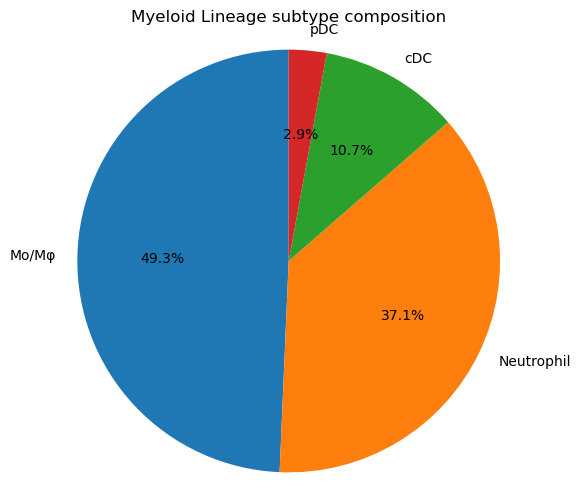

In [3]:
import matplotlib.pyplot as plt

counts = adata.obs['myeloid_subtype'].value_counts()

plt.figure(figsize=(6,6))
plt.pie(
    counts.values,
    labels=counts.index,
    autopct='%1.1f%%',
    startangle=90
)
plt.axis('equal')
plt.title('Myeloid Lineage subtype composition')
plt.show()

In [4]:
adata.obs['myeloid_subtype'] = adata.obs['myeloid_subtype'].replace({'Mo/Mφ': 'Macrophage Monocyte'})

/tmp/ipykernel_2407221/1237153576.py:1: FutureWarning: The behavior of Series.replace (and DataFrame.replace) with CategoricalDtype is deprecated. In a future version, replace will only be used for cases that preserve the categories. To change the categories, use ser.cat.rename_categories instead.
  adata.obs['myeloid_subtype'] = adata.obs['myeloid_subtype'].replace({'Mo/Mφ': 'Macrophage Monocyte'})


Processing genesets: 9it [00:01,  7.91it/s]                       

Error processing Neutrophil for WikiPathway_2024_Human: 'WikiPathway_2024_Human'
Error processing pDC for WikiPathway_2024_Human: 'WikiPathway_2024_Human'
Error processing Macrophage Monocyte for WikiPathway_2024_Human: 'WikiPathway_2024_Human'
Error processing cDC for WikiPathway_2024_Human: 'WikiPathway_2024_Human'


Processing genesets: 32it [00:01, 16.14it/s]


Trying to re-request...
Error processing Macrophage Monocyte for WikiPathway_2024_Human: 'WikiPathway_2024_Human'
Macrophage Monocyte with WikiPathway_2024_Human completed!
Error processing Neutrophil for WikiPathway_2024_Human: 'WikiPathway_2024_Human'
Neutrophil with WikiPathway_2024_Human completed!
Error processing cDC for WikiPathway_2024_Human: 'WikiPathway_2024_Human'
cDC with WikiPathway_2024_Human completed!
Error processing pDC for WikiPathway_2024_Human: 'WikiPathway_2024_Human'
pDC with WikiPathway_2024_Human completed!


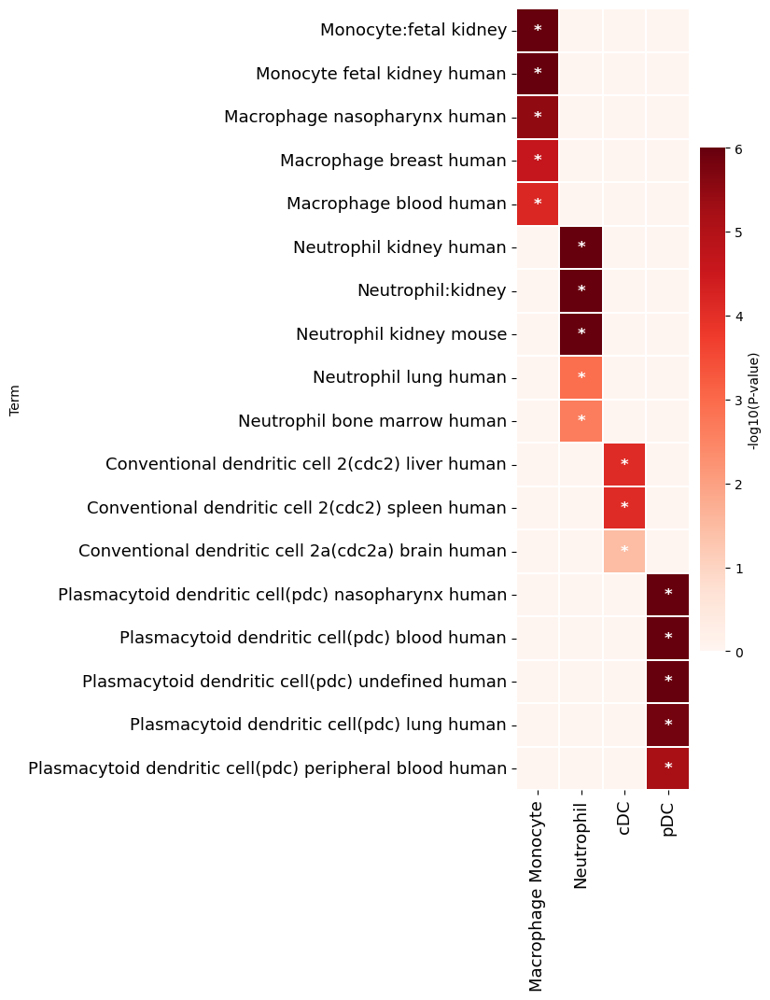

In [5]:
sc.pp.normalize_total(adata,target_sum=1e4) 
sc.pp.log1p(adata)
import pandas as pd
sc.tl.rank_genes_groups(adata, 'myeloid_subtype', method="wilcoxon",use_raw =False)
sc.tl.dendrogram(adata, groupby='myeloid_subtype')

result = adata.uns["rank_genes_groups"]
groups = result["names"].dtype.names

result_df = pd.DataFrame(
    {
        f"{group}_{key}": result[key][group]
        for group in groups
        for key in ["names", "pvals_adj", "logfoldchanges", "scores"]
    })
up_dict = {}
down_dict = {}

for group in groups:
    n_col = f"{group}_names"
    p_col = f"{group}_pvals_adj"
    l_col = f"{group}_logfoldchanges"
    s_col = f"{group}_scores"

    degs_sig = result_df[result_df[p_col] < 0.05]
    degs_up = degs_sig[degs_sig[l_col] > 1].sort_values(by=s_col, ascending=False)
    degs_dw = degs_sig[degs_sig[l_col] < -1].sort_values(by=s_col, ascending=True)
    up_dict[group] = degs_up[n_col].reset_index(drop=True)
    down_dict[group] = degs_dw[n_col].reset_index(drop=True)

df_merge_up = pd.concat(up_dict.values(), axis=1)
df_merge_up.columns = list(up_dict.keys())

df_merge_down = pd.concat(down_dict.values(), axis=1)
df_merge_down.columns = list(down_dict.keys())

sc.tl.dendrogram(adata, groupby='myeloid_subtype')

result = adata.uns["rank_genes_groups"]
groups = result["names"].dtype.names
result_df = pd.DataFrame(
    {
        f"{group}_{key}": result[key][group]
        for group in groups
        for key in ["names", "pvals_adj", "logfoldchanges", "scores"]
    }
)
up_dict = {}
down_dict = {}

for group in groups:
    n_col = f"{group}_names"
    p_col = f"{group}_pvals_adj"
    l_col = f"{group}_logfoldchanges"
    s_col = f"{group}_scores"
    degs_sig = result_df[result_df[p_col] < 0.05]
    degs_up = degs_sig[degs_sig[l_col] > 1].sort_values(by=s_col, ascending=False)
    degs_dw = degs_sig[degs_sig[l_col] < -1].sort_values(by=s_col, ascending=True)
    up_dict[group] = degs_up[n_col].reset_index(drop=True)
    down_dict[group] = degs_dw[n_col].reset_index(drop=True)

df_merge_up = pd.concat(up_dict.values(), axis=1)
df_merge_up.columns = list(up_dict.keys())

df_merge_down = pd.concat(down_dict.values(), axis=1)
df_merge_down.columns = list(down_dict.keys())

import sys
sys.path.append("/home/Data_Drive_8TB/kykim/QED")
from qed.data import readtxt, readseurat, readscanpy
from qed.data import get_enrichment_dataframes
from qed.data import merge_df
from qed.data import query
import inspect

import pandas as pd
class GeneSet:
    def __init__(self, genes, name, annot=None):
        self.genes = genes
        self.name = name
        self.params = {}
        self.GO = []
        self.annot = annot or {}
dblist = [
'CellMarker_2024','CellMarker_Augmented_2021',"PanglaoDB_Augmented_2021",    'KEGG_2021_Human',
    'Reactome_2022',
    'MSigDB_Hallmark_2020',
    'GO_Biological_Process_2023',
    'WikiPathway_2024_Human'
]

df_merge_up_100 = df_merge_up.head(20)
df_merge_up_100.to_csv('breast_cancer_DEG_up_leiden.csv', index=False, header=True)

alist = pd.read_csv('breast_cancer_DEG_up_leiden.csv')
geneset_list = []
for col in alist.columns:
    genes = alist[col].dropna().tolist()
    gs = GeneSet(genes=genes, name=col, annot={"Leiden": col})
    geneset_list.append(gs)

aalist = get_enrichment_dataframes(
    geneset_list=geneset_list,
    dblist=dblist,
    annot_colname="Leiden",
    n_jobs=None,
    handle_error=True,
    max_iter=1
)

df = merge_df(aalist)
df['Term'] = df['Term'].str.split(r'\(GO:').str[0].str.strip()
df['Term'] = df['Term'].str.split('R-H').str[0].str.strip()
df['Term'] = df['Term'].str.split('WP').str[0].str.strip()

from typing import List, Tuple, Dict
def heatmap_with_groupwise_ordering(df: pd.DataFrame,
                                     n: int,
                                     group_by: str,
                                     order_by: str = "Adjusted p-value",
                                     cmap: str = 'Blues',
                                     xlabel_rotation: int = 90,
                                     xlabel_fontsize: int = 15,
                                     ylabel_fontsize: int = 15,
                                     figsize: Tuple = (15, 10),
                                     vmin: float = None,
                                     vmax: float = None,
                                     cbar_kws: Dict = None,
                                     linewidths: float = 0.1,
                                     title: str = None,
                                     save_to_file: str = None,
                                     enable_column_order: bool = False,
                                     column_order: list = None,
                                     enable_highlight_columns: bool = False,
                                     highlight_column_names: list = None):

    if not isinstance(df, pd.DataFrame):
        raise TypeError("입력 'df'는 pandas DataFrame이어야 합니다.")
    if group_by not in df.columns:
        raise ValueError(f"'{group_by}' 컬럼이 DataFrame에 존재하지 않습니다.")
    if order_by not in df.columns:
        raise ValueError(f"'{order_by}' 컬럼이 DataFrame에 존재하지 않습니다.")
    if 'Term' not in df.columns:
        raise ValueError("'Term' 컬럼이 DataFrame에 존재하지 않습니다.")

    has_overlapping_genes = 'Overlapping genes' in df.columns

    # P-value 컬럼 숫자형 강제 변환
    df_copy = df.copy()
    df_copy[order_by] = pd.to_numeric(df_copy[order_by], errors='coerce')
    df = df_copy

    df['Term_lower'] = df['Term'].str.lower()

    # 상위 n개 Term 추출
    df_filtered_by_order = df[df[order_by].notna()]
    df_ranked_per_group = (
        df_filtered_by_order
        .sort_values(order_by)
        .groupby(group_by)
        .head(n)
        .reset_index(drop=True)
    )
    if df_ranked_per_group.empty:
        print(f"⚠️ 각 그룹에서 상위 {n}개의 Term을 선택할 수 없습니다.")
        return None, None

    all_selected_terms_lower = df_ranked_per_group['Term_lower'].unique()

    # Overlapping genes 처리
    overlapping_genes_pivot = pd.DataFrame()
    if has_overlapping_genes:
        overlapping_genes_df = df[df['Term_lower'].isin(all_selected_terms_lower)][['Term_lower', group_by, 'Overlapping genes']]
        overlapping_genes_df['Overlapping genes'] = overlapping_genes_df['Overlapping genes'].apply(
            lambda x: ', '.join(map(str, x)) if isinstance(x, list) else str(x)
        )
        overlapping_genes_df = overlapping_genes_df.groupby(['Term_lower', group_by])['Overlapping genes'].apply(', '.join).reset_index()
        overlapping_genes_df.rename(columns={'Term_lower': 'Term'}, inplace=True)
        overlapping_genes_pivot = overlapping_genes_df.pivot(index='Term', columns=group_by, values='Overlapping genes').fillna('')
        overlapping_genes_pivot.index = overlapping_genes_pivot.index.map(lambda x: x.capitalize())

    # P-value pivot table
    aggregated_df = df[df['Term_lower'].isin(all_selected_terms_lower)].groupby(['Term_lower', group_by], as_index=False)[order_by].min()
    aggregated_df.rename(columns={'Term_lower': 'Term'}, inplace=True)
    pivot_df = aggregated_df.pivot(index="Term", columns=group_by, values=order_by).fillna(1).rename_axis(None, axis=1)

    # Log 변환
    is_pvalue_column = order_by.lower() in ['adjusted p-value', 'p-value']
    pivot_df_for_heatmap = -np.log10(np.maximum(pivot_df, np.finfo(float).eps)) if is_pvalue_column else pivot_df.copy()
    pivot_df_for_heatmap.index = pivot_df_for_heatmap.index.map(lambda x: x.capitalize())

    # ✅ Overlapping genes와 결합
    final_pivot_df = pd.concat([pivot_df_for_heatmap, overlapping_genes_pivot], axis=1)

    if save_to_file:
        try:
            final_pivot_df.to_csv(save_to_file, encoding='utf-8-sig')
            print(f"✅ 히트맵 데이터 저장 완료: '{save_to_file}'")
        except Exception as e:
            print(f"❌ 저장 실패: {e}")

    # ✅ column_order 기준 row 정렬
    row_order = []
    seen_terms = set()

    if enable_column_order and column_order:
        group_order_for_plot = [group for group in column_order if group in df[group_by].unique()]
    else:
        group_order_for_plot = sorted(df[group_by].unique())  # ✅ X축 정렬에 맞춤

    # 🔑 Y축을 X축 순서에 맞춰 계단식으로 GO term 배치
    for group in group_order_for_plot:
        current_group_terms = (
            df_ranked_per_group[df_ranked_per_group[group_by] == group]
            .sort_values(order_by)
        )
        for term_lower_val in current_group_terms['Term_lower']:
            capitalized_term = term_lower_val.capitalize()
            if capitalized_term in pivot_df_for_heatmap.index and capitalized_term not in seen_terms:
                row_order.append(capitalized_term)
                seen_terms.add(capitalized_term)

    # row_order 적용
    clustered_data = final_pivot_df.loc[row_order]
    heatmap_data = clustered_data.select_dtypes(include=[np.number])
   # 1️⃣ 사용자 지정 column_order가 있으면 그 순서 적용
    if enable_column_order and column_order:
        valid_cols = [c for c in column_order if c in heatmap_data.columns]
        if valid_cols:
            heatmap_data = heatmap_data[valid_cols]

# 2️⃣ column_order가 없고, 열 이름이 전부 숫자로 해석 가능하면 오름차순 정렬
    else:
        try:
        # 모든 열 이름을 float으로 바꿔 보고 성공하면 오름차순 재정렬
            numeric_col_keys = [float(c) for c in heatmap_data.columns]
            sorted_cols = [col for _, col in sorted(zip(numeric_col_keys, heatmap_data.columns))]
            heatmap_data = heatmap_data[sorted_cols]
        except ValueError:
        # 열 이름이 숫자가 아닌 게 섞여 있으면 그대로 둡니다
            pass


    if is_pvalue_column:
        p_values_for_annotation = 10 ** (-np.clip(heatmap_data, None, 300))
        annotations = np.where(p_values_for_annotation <= 0.05, '*', '')
        annotations = annotations.astype(object)
    else:
        annotations = False

    # ✅ 열 강조 인덱스 계산 (선 추가)
    highlight_column_indices = []
    if enable_highlight_columns and highlight_column_names:
        highlight_column_indices = [
            list(heatmap_data.columns).index(col)
            for col in highlight_column_names if col in heatmap_data.columns
        ]

    # ✅ 시각화
    fig, ax = plt.subplots(figsize=figsize)
    sns.heatmap(heatmap_data, cmap=cmap, vmin=vmin, vmax=vmax,
                linewidths=linewidths, annot=annotations, fmt='',
                linecolor='white', ax=ax, cbar_kws=cbar_kws, square=True,
                annot_kws={"size": 12, "color": "white", "weight": "bold"})

    # 수직선 추가
    for x in highlight_column_indices:
        ax.vlines(x + 1, *ax.get_ylim(), colors='black', linewidth=2)

    plt.xticks(rotation=xlabel_rotation, fontsize=xlabel_fontsize)
    plt.yticks(fontsize=ylabel_fontsize)
    if title:
        ax.set_title(title, fontsize=18, pad=20)
    plt.grid(False)

    if 'Term_lower' in df.columns:
        df.drop(columns='Term_lower', inplace=True)

    return fig, ax
    
#df_filtered = df[df.apply(lambda x: str(x['Leiden']) in str(x['Term']), axis=1)]

df_filtered = df[
    df.apply(
        lambda x: any(t in x['Term'] for t in str(x['Leiden']).split()),
        axis=1)]

df_sorted = df_filtered.sort_values(by='Rank')

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

fig, ax = heatmap_with_groupwise_ordering(
    df= df_sorted,
    n=5,
    group_by='Leiden',
    order_by="Adjusted p-value",
    cmap='Reds',
    xlabel_rotation=90,
    xlabel_fontsize=13,
    ylabel_fontsize=13,
    figsize=(3, 14),
    vmin=0, vmax=6,
    cbar_kws={'shrink': 0.5, 'label': '-log10(P-value)'},
    enable_column_order=False,
   # column_order=[
   #     "Contractile cardiomyocyte", 
   #     "Myogenerative cardiomyocyte", 
   #     "Inflammatory cardiomyocyte"
   # ],
    enable_highlight_columns=False,
   # highlight_column_names=[
   #     "Contractile cardiomyocyte", 
   #     "Inflammatory cardiomyocyte"
   # ]
)

<Figure size 800x500 with 0 Axes>

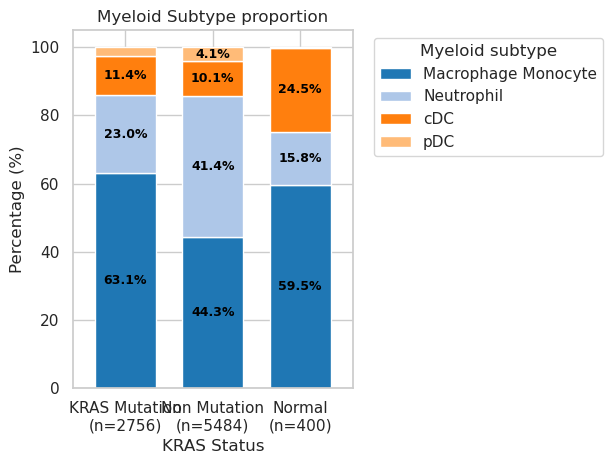

In [38]:
import pandas as pd
import matplotlib.pyplot as plt

counts = pd.crosstab(adata.obs['KRAS_mutation'], adata.obs['myeloid_subtype'])
percentage = counts.div(counts.sum(axis=1), axis=0) * 100

colors = plt.cm.tab20.colors
plt.figure(figsize=(8,5))
ax = percentage.plot(kind='bar', stacked=True, color=colors, width=0.7)

plt.ylabel("Percentage (%)")
plt.xlabel("KRAS Status")
plt.title("Myeloid Subtype proportion")
plt.legend(title='Myeloid subtype', bbox_to_anchor=(1.05, 1), loc='upper left')
total_counts = counts.sum(axis=1)
xticks_labels = [f"{kr}\n(n={total_counts[kr]})" for kr in counts.index]
ax.set_xticklabels(xticks_labels, rotation=0)
for i, (idx, row) in enumerate(percentage.iterrows()):
    cumulative = 0
    for j, value in enumerate(row):
        if value > 3:
            ax.text(
                i, cumulative + value / 2,
                f"{value:.1f}%",
                ha='center', va='center', color='black', fontsize=9, fontweight='bold'
            )
        cumulative += value

plt.tight_layout()
plt.show()

# Macrophage/Monocyte subtype

In [170]:
import scanpy as sc
adata = sc.read_h5ad("/home/Data_Drive_8TB/kykim/5. CRC (Myeloid)/Mye_raw_H5ad/total_after_clustering_data.h5ad")

In [171]:
adata.raw = adata.copy()

In [172]:
adata = adata[adata.obs['myeloid_subtype'] == 'Mo/Mφ'].copy()

/home/Data_Drive_8TB/kykim/.conda/envs/kykim/lib/python3.9/site-packages/scanpy/preprocessing/_highly_variable_genes.py:75: UserWarning: `flavor='seurat_v3'` expects raw count data, but non-integers were found.
  warnings.warn(


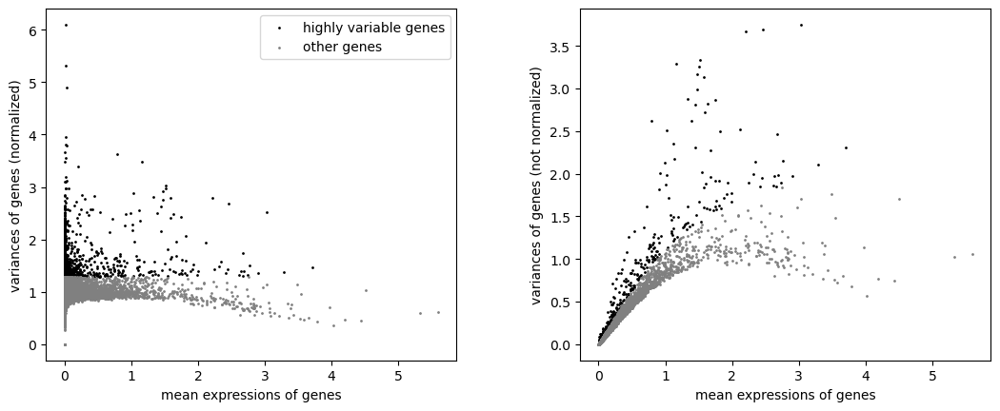

In [173]:
sc.pp.highly_variable_genes(adata, flavor='seurat_v3',n_top_genes=2000)
sc.pl.highly_variable_genes(adata)

In [174]:
adata = adata[:, adata.var.highly_variable].copy()

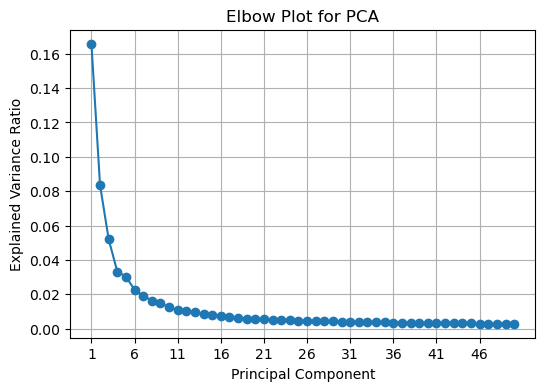

In [175]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

sc.tl.pca(adata)
explained_variance_ratio = adata.uns["pca"]["variance_ratio"]

plt.figure(figsize=(6, 4))
plt.plot(range(1, len(explained_variance_ratio) + 1), explained_variance_ratio, marker="o", linestyle="-")
plt.xlabel("Principal Component")
plt.ylabel("Explained Variance Ratio")
plt.title("Elbow Plot for PCA")
plt.xticks(np.arange(1, len(explained_variance_ratio) + 1, step=5))
plt.grid()
plt.show()

In [176]:
sc.tl.pca(adata, n_comps=6, svd_solver='arpack')

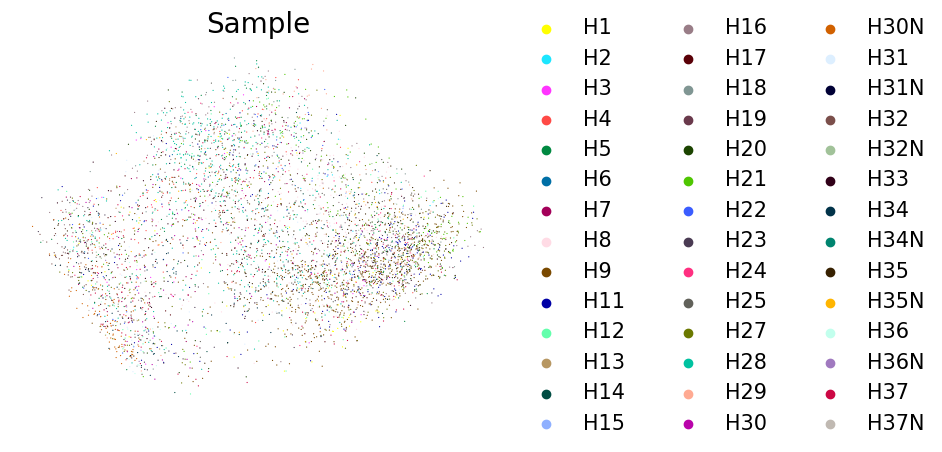

In [177]:
sc.pl.pca(
    adata,
    color=['sample'],
    frameon=False,
    size= 3,
    legend_fontsize=15,
    legend_fontoutline=3,
    title="CluVar UMAP",
    show=False)
plt.title("Sample", fontsize=20)
sc.pp.neighbors(adata)
adata.X = adata.X.astype(np.float32)
sc.tl.pca(adata, svd_solver="arpack", n_comps=50)
sc.pp.neighbors(adata, use_rep="X_pca", n_neighbors=15, n_pcs=50)
sc.tl.umap(adata)

In [178]:
import scvi 

scvi.model.SCVI.setup_anndata(adata, batch_key="sample")
vae = scvi.model.SCVI(adata, n_layers=2, n_latent=30, gene_likelihood="nb")

vae.train(max_epochs=400, early_stopping=True, early_stopping_patience=10)

/home/Data_Drive_8TB/kykim/.conda/envs/kykim/lib/python3.9/site-packages/scvi/data/fields/_base_field.py:64: UserWarning: adata.X does not contain unnormalized count data. Are you sure this is what you want?
  self.validate_field(adata)
/home/Data_Drive_8TB/kykim/.conda/envs/kykim/lib/python3.9/site-packages/scvi/data/fields/_dataframe_field.py:186: UserWarning: Category 35 in adata.obs['_scvi_batch'] has fewer than 3 cells. Models may not train properly.
  categorical_mapping = _make_column_categorical(
Trainer will use only 1 of 2 GPUs because it is running inside an interactive / notebook environment. You may try to set `Trainer(devices=2)` but please note that multi-GPU inside interactive / notebook environments is considered experimental and unstable. Your mileage may vary.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1]
/home/Data_Drive_8TB/kykim/.conda/envs/kykim/lib/python3.9/site-packages/lightning/pyt

Epoch 107/400:  27%|██▋       | 107/400 [01:19<03:36,  1.35it/s, v_num=1, train_loss_step=314, train_loss_epoch=278]
Monitored metric elbo_validation did not improve in the last 10 records. Best score: 314.651. Signaling Trainer to stop.


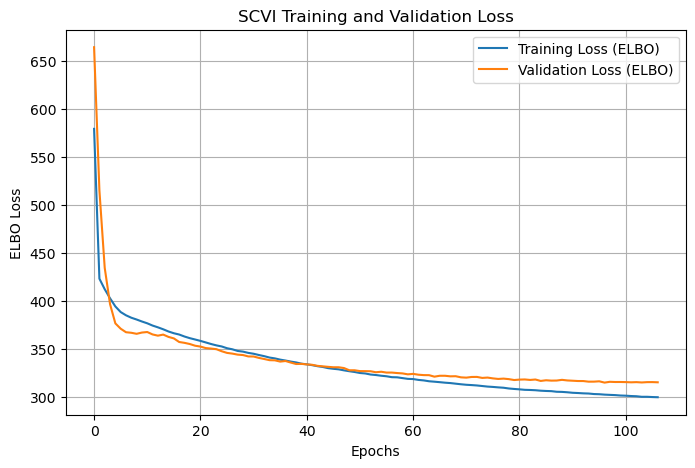

In [179]:
import matplotlib.pyplot as plt

train_loss = vae.history["elbo_train"]
val_loss = vae.history["elbo_validation"]
plt.figure(figsize=(8, 5))
plt.plot(train_loss, label="Training Loss (ELBO)")
plt.plot(val_loss, label="Validation Loss (ELBO)")
plt.xlabel("Epochs")
plt.ylabel("ELBO Loss")
plt.title("SCVI Training and Validation Loss")
plt.legend()
plt.grid()
plt.show()

In [181]:
for res in [0.50, 0.75, 1,1.25]:
    sc.tl.leiden(
        adata, key_added=f"leiden_res_{res:4.2f}", resolution=res, flavor="igraph"
    )

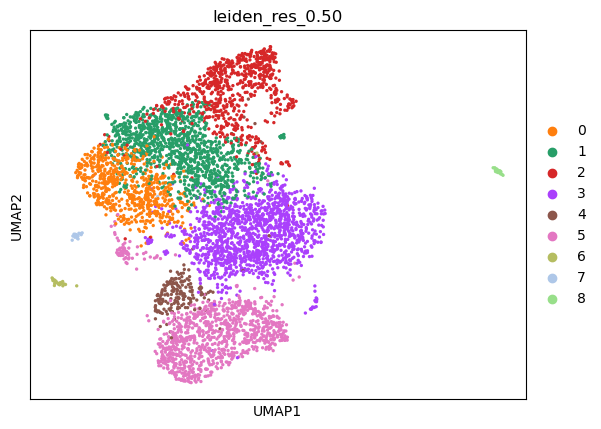

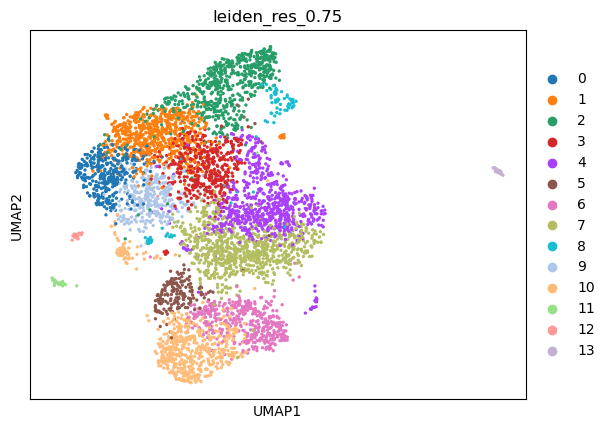

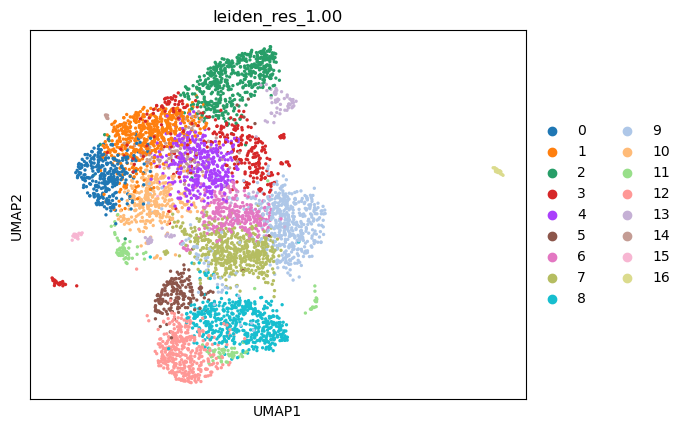

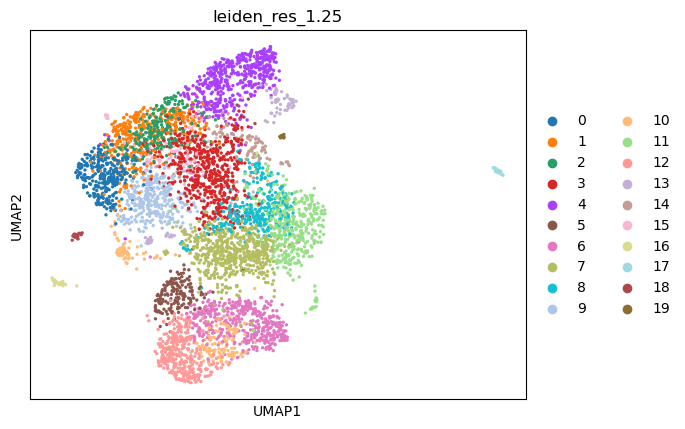

In [182]:
sc.pl.umap(adata, color=["leiden_res_0.50"])
sc.pl.umap(adata, color=["leiden_res_0.75"])
sc.pl.umap(adata, color=["leiden_res_1.00"])
sc.pl.umap(adata, color=["leiden_res_1.25"])

Cluster 0: ['S100A6', 'S100A4', 'S100A8', 'THBS1', 'TIMP1', 'H3-3A', 'AREG', 'FAU', 'RPLP2', 'RPL34', 'RPL35A', 'FPR1', 'SH3BGRL3', 'IFI30', 'RPL30', 'FCN1', 'RPS13', 'RPS10', 'RPL8', 'RPL39']
Cluster 1: ['S100A8', 'S100A9', 'NAMPT', 'S100A6', 'MCL1', 'NLRP3', 'VCAN', 'SAMSN1', 'S100A4', 'KDM6B', 'FCN1', 'IL1B', 'NEAT1', 'BCL2A1', 'SIPA1L1', 'SRGN', 'DENND5A', 'SLC2A3', 'SLC11A1', 'NFKB1']
Cluster 2: ['TIMP1', 'SOD2', 'G0S2', 'NAMPT', 'SRGN', 'BCL2A1', 'PLAUR', 'H3-3A', 'S100A8', 'CD44', 'THBS1', 'FTH1', 'MALAT1', 'S100A10', 'SAMSN1', 'FCN1', 'SLC25A37', 'TREM1', 'NFKBIA', 'RILPL2']
Cluster 3: ['IL1B', 'NFKBIA', 'IER3', 'TNFAIP3', 'SOD2', 'EREG', 'CXCL2', 'NFKB1', 'PPP1R15A', 'PLAUR', 'DUSP2', 'NAMPT', 'AREG', 'BTG1', 'CXCL8', 'KDM6B', 'GPR183', 'SIPA1L1', 'PNRC1', 'NEAT1']
Cluster 4: ['TIMP1', 'SOD2', 'BCL2A1', 'HSPA1A', 'MALAT1', 'IL1RN', 'SLC2A3', 'FTH1', 'CD44', 'CXCL8', 'DNAJB1', 'NFKBIA', 'IL1B', 'HSPA1B', 'G0S2', 'CCL3L3', 'C15orf48', 'SLC25A37', 'CCL3', 'HSP90AA1']
Cluster 5: [

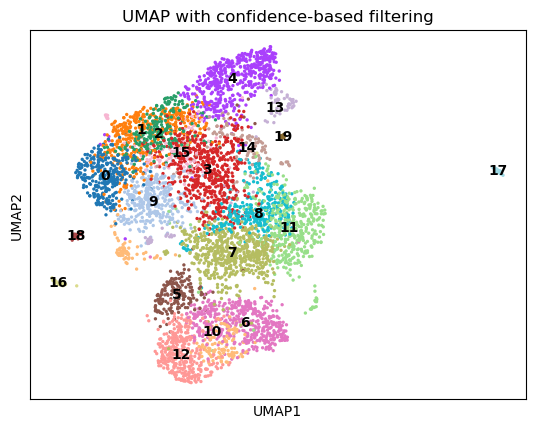

In [196]:
import scanpy as sc
adata.obs['leiden_res_1.25'] = adata.obs['leiden_res_1.25'].astype('category')
sc.tl.rank_genes_groups(adata, groupby='leiden_res_1.25', method='t-test')

top_genes = {}

groups = adata.uns['rank_genes_groups']['names'].dtype.names

for group in groups:
    genes = adata.uns['rank_genes_groups']['names'][group][:20]
    top_genes[group] = genes.tolist()

for cluster, genes in top_genes.items():
    print(f"Cluster {cluster}: {genes}")
sc.pl.umap(
    adata,
    color='leiden_res_1.25',
    title='UMAP with confidence-based filtering',
    legend_loc='on data')

In [184]:
adata = adata.raw.to_adata()

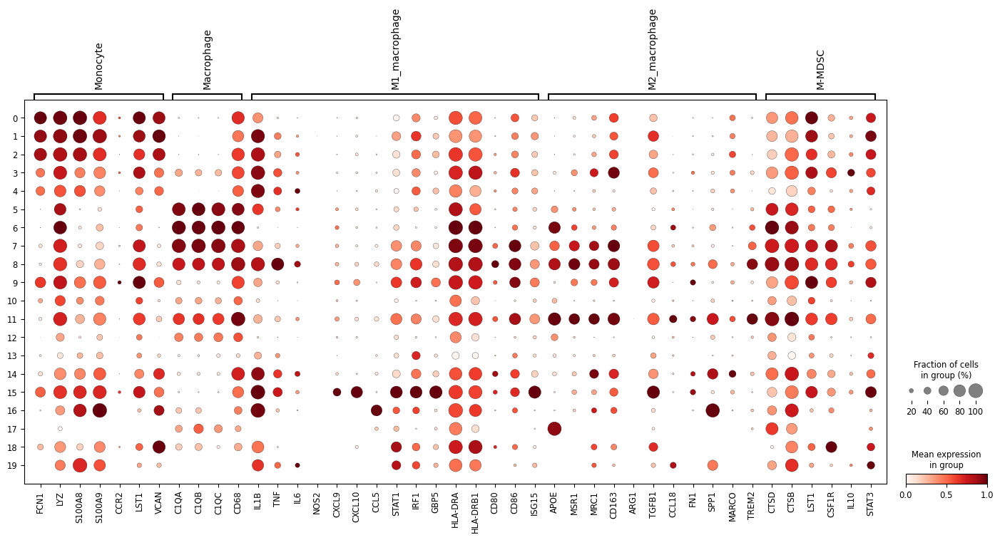

In [198]:
import scanpy as sc
group_markers = {"Monocyte": [
            "FCN1", "LYZ", "S100A8", "S100A9", "CCR2", "LST1", "VCAN"
        ],
        "Macrophage": [
            "C1QA", "C1QB", "C1QC", "CD68"
        ],
        "M1_macrophage": [
            "IL1B", "TNF", "IL6", "NOS2",
            "CXCL9", "CXCL10", "CCL5",
            "STAT1", "IRF1", "GBP5",
            "HLA-DRA", "HLA-DRB1",
            "CD80", "CD86", "ISG15"
        ],
        "M2_macrophage": [
            "APOE", "MSR1", "MRC1", "CD163",
            "ARG1", "TGFB1", "CCL18",
            "FN1", "SPP1", "MARCO", "TREM2"
        ],
        "M-MDSC": [
            "CTSD", "CTSB", "LST1", "CSF1R",
            "IL10", "WFDC17", "STAT3"
        ]    
            }


existing_genes = {cat: [gene for gene in genes if gene in adata.var_names] 
                  for cat, genes in group_markers.items()}
existing_genes = {cat: genes for cat, genes in existing_genes.items() if genes}
sc.pl.dotplot(adata, var_names=existing_genes, groupby="leiden_res_1.25", standard_scale="var")

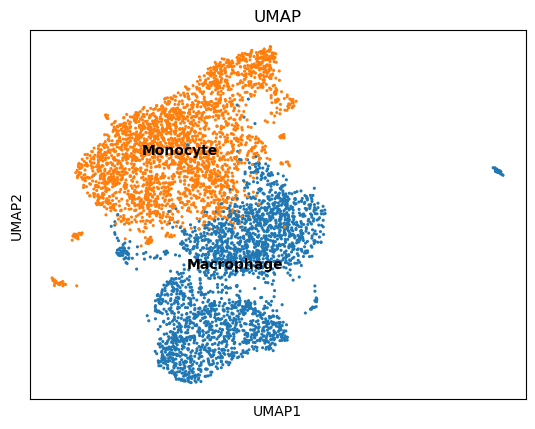

In [250]:
cluster_to_group = {
    0: "Monocyte",      
    1: "Monocyte",        
    2: "Monocyte",          
    3: "Monocyte",     
    4: "Monocyte",    
    5: "Macrophage",    
    6: "Macrophage",         
    7: "Macrophage",     
    8: "Macrophage",
    9: "Monocyte",
    10: "Macrophage",    
    11: "Macrophage",
    12: "Macrophage",    
    13: "Monocyte",         
    14: "Monocyte",     
    15: "Monocyte",
    16: "Monocyte",
    17: "Macrophage",
    18: "Monocyte",
    19: "Monocyte"}


adata.obs["myeloid_subtype"] = adata.obs["leiden_res_1.25"].astype(int).map(cluster_to_group)
sc.pl.umap(
    adata,
    color='myeloid_subtype',
    title='UMAP',
    legend_loc='on data'
    , s = 20
)

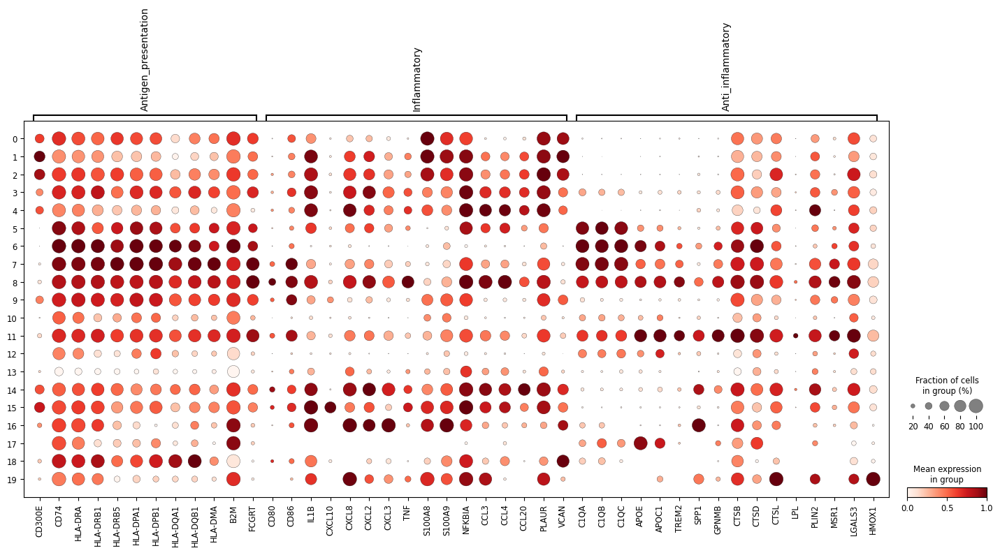

In [6]:
###### import scanpy as sc
group_markers = {
    "Antigen_presentation": ["CD300E","CD74","HLA-DRA","HLA-DRB1","HLA-DRB5","HLA-DPA1","HLA-DPB1","HLA-DQA1","HLA-DQB1","HLA-DMA","B2M","FCGRT"],
    "Inflammatory": ["CD80","CD86","IL1B","CXCL10","CXCL8","CXCL2","CXCL3","TNF","S100A8","S100A9","NFKBIA","CCL3","CCL4","CCL20","PLAUR","VCAN"],
    "Anti_inflammatory": ["C1QA","C1QB","C1QC","APOE","APOC1","TREM2","SPP1","GPNMB","CTSB","CTSD","CTSL","LPL","PLIN2","MSR1","LGALS3","HMOX1"]
}
existing_genes = {cat: [gene for gene in genes if gene in adata.var_names] 
                  for cat, genes in group_markers.items()}
existing_genes = {cat: genes for cat, genes in existing_genes.items() if genes}
sc.pl.dotplot(adata, var_names=existing_genes, groupby="leiden_res_1.25", standard_scale="var")

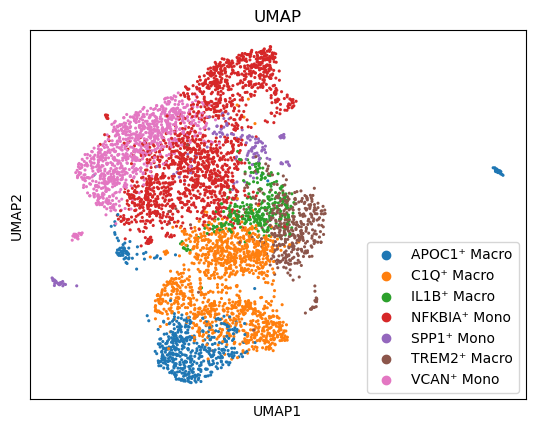

In [281]:
cluster_to_group = {
    0: "VCAN⁺ Mono",      
    1: "VCAN⁺ Mono",        
    2: "VCAN⁺ Mono",          
    3: "NFKBIA⁺ Mono",     
    4: "NFKBIA⁺ Mono",    
    5: "C1Q⁺ Macro",    
    6: "C1Q⁺ Macro",         
    7: "C1Q⁺ Macro",     
    8: "IL1B⁺ Macro",
    9: "NFKBIA⁺ Mono",
    10: "APOC1⁺ Macro",    
    11: "TREM2⁺ Macro",
    12: "APOC1⁺ Macro",    
    13: "NFKBIA⁺ Mono",         
    14: "SPP1⁺ Mono",     
    15: "NFKBIA⁺ Mono",
    16: "SPP1⁺ Mono",
    17: "APOC1⁺ Macro",
    18: "VCAN⁺ Mono",
    19: "SPP1⁺ Mono"}

adata.obs["test"] = adata.obs["leiden_res_1.25"].astype(int).map(cluster_to_group)

sc.pl.umap(
    adata,
    color='test',
    title='UMAP',
    legend_loc= False
    , s = 20)

In [259]:
import scanpy as sc

sc.tl.rank_genes_groups(adata, groupby='test', method='t-test')

top_genes = {}

groups = adata.uns['rank_genes_groups']['names'].dtype.names

for group in groups:
    genes = adata.uns['rank_genes_groups']['names'][group][:30]
    top_genes[group] = genes.tolist()

for cluster, genes in top_genes.items():
    print(f"Cluster {cluster}: {genes}")

Cluster APOC1⁺ Macro: ['TMSB4X', 'FTL', 'TUBA1B', 'TMSB10', 'PFN1', 'APOC1', 'RPS2', 'EEF1A1', 'YBX1', 'GPX1', 'FABP5', 'UCP2', 'RPL35', 'STMN1', 'ACTB', 'PPIA', 'NUPR1', 'RPS18', 'RPLP1', 'RPS6', 'GAPDH', 'PPDPF', 'HMGN2', 'RPL41', 'SLC40A1', 'TUBB', 'RPSA', 'PTMS', 'H4C3', 'RPLP0']
Cluster C1Q⁺ Macro: ['C1QC', 'C1QA', 'C1QB', 'CD74', 'HLA-DPA1', 'HLA-DPB1', 'HLA-DRA', 'CTSD', 'TMEM176B', 'HLA-DRB5', 'HLA-DQA1', 'TMSB4X', 'ITM2B', 'HLA-DRB1', 'CST3', 'HLA-DQB1', 'CTSC', 'NPC2', 'TMEM176A', 'PLD3', 'CD68', 'B2M', 'MS4A6A', 'HLA-DMA', 'GRN', 'APOE', 'CTSB', 'FTL', 'HLA-DQA2', 'SLC40A1']
Cluster IL1B⁺ Macro: ['NFKBIA', 'CTSD', 'IER3', 'CCL4', 'CCL3', 'CD83', 'NFKBIZ', 'CTSB', 'DUSP2', 'ZFP36', 'PPP1R15A', 'KLF6', 'C1QC', 'GRN', 'CCL4L2', 'CXCL2', 'CXCL8', 'TNF', 'C1QA', 'PLD3', 'CTSZ', 'JUN', 'CTSC', 'NPC2', 'C1QB', 'TNFAIP3', 'FCGRT', 'FMNL2', 'IL1B', 'GPNMB']
Cluster NFKBIA⁺ Mono: ['MALAT1', 'SOD2', 'NFKBIA', 'NAMPT', 'NEAT1', 'TIMP1', 'IL1B', 'BCL2A1', 'CD44', 'BTG1', 'PLAUR', 'TNFAIP

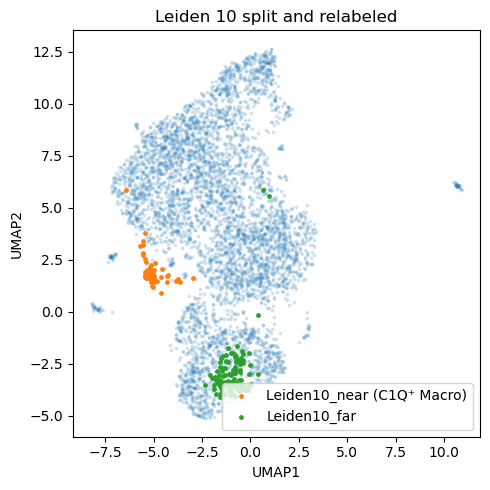

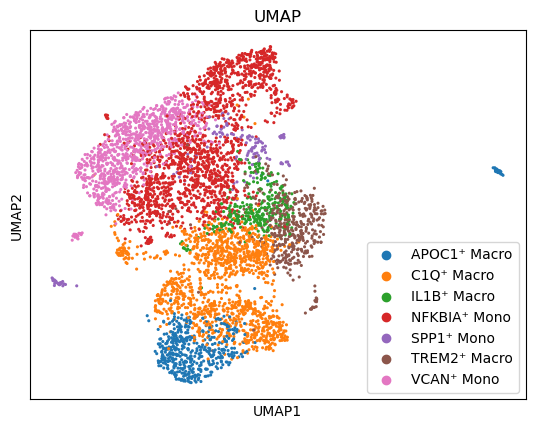

In [5]:
import numpy as np
import matplotlib.pyplot as plt

mask_10 = adata.obs["leiden_res_1.25"].astype(int) == 10

X = adata.obsm["X_umap"]
X_10 = X[mask_10]

umap1 = X_10[:, 0]

cutoff = np.percentile(umap1, 34)

near_mask = umap1 <= cutoff
far_mask = umap1 > cutoff

near_barcodes = adata.obs_names[mask_10][near_mask]

adata.obs.loc[near_barcodes, "test"] = "C1Q⁺ Macro"

plt.figure(figsize=(5, 5))
plt.scatter(X[:, 0], X[:, 1], s=3, alpha=0.15)

plt.scatter(
    X_10[near_mask, 0],
    X_10[near_mask, 1],
    s=6,
    label="Leiden10_near (C1Q⁺ Macro)"
)
plt.scatter(
    X_10[far_mask, 0],
    X_10[far_mask, 1],
    s=6,
    label="Leiden10_far"
)

plt.xlabel("UMAP1")
plt.ylabel("UMAP2")
plt.title("Leiden 10 split and relabeled")
plt.legend()
plt.tight_layout()
plt.show()

sc.pl.umap(
    adata,
    color='test',
    title='UMAP',
    legend_loc= False
    , s = 20)

In [28]:
import scanpy as sc
adata = sc.read_h5ad("/home/Data_Drive_8TB/kykim/5. CRC (Myeloid)/Mye_raw_H5ad/macro_mono_UMAP_lognorm.h5ad")

In [32]:
import pandas as pd

save_path = "/home/Data_Drive_8TB/kykim/5. CRC (Myeloid)/Mye_raw_H5ad/macro_mono_anno.csv"

pd.DataFrame(adata.obs["test"]).to_csv(save_path, index=True)

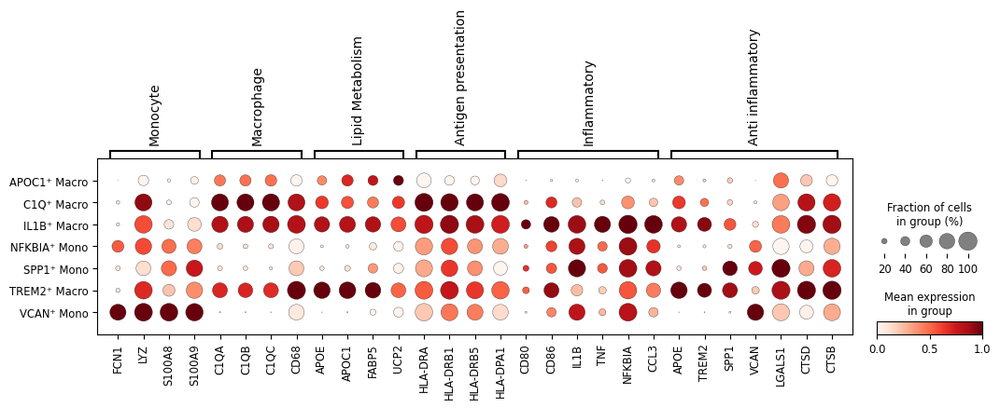

In [15]:
import scanpy as sc

group_markers = {
    "Monocyte": ["FCN1", "LYZ", "S100A8", "S100A9"],
    "Macrophage": ["C1QA", "C1QB", "C1QC", "CD68"],
    "Lipid Metabolism": ["APOE","APOC1","FABP5","UCP2"],
    "Antigen presentation": ["HLA-DRA","HLA-DRB1","HLA-DRB5","HLA-DPA1"],
    "Inflammatory": ["CD80","CD86","IL1B","TNF","NFKBIA","CCL3"],
    "Anti inflammatory": ["APOE","TREM2","SPP1","VCAN","LGALS1","CTSD","CTSB"]}

existing_genes = {cat: [gene for gene in genes if gene in adata.var_names] 
                  for cat, genes in group_markers.items()}
existing_genes = {cat: genes for cat, genes in existing_genes.items() if genes}
sc.pl.dotplot(adata, var_names=existing_genes, groupby="test", standard_scale="var")

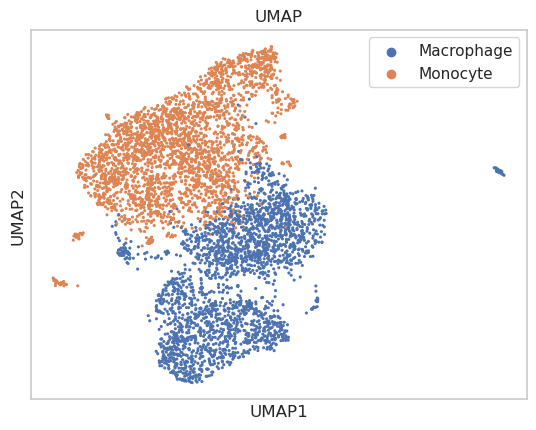

In [19]:
mapping = {
    "0": "Monocyte",
    "1": "Monocyte",
    "2": "Monocyte",
    "3": "Monocyte",
    "4": "Monocyte",
    "5": "Macrophage",
    "6": "Macrophage",
    "7": "Macrophage",
    "8": "Macrophage",
    "9": "Monocyte",
    "10": "Macrophage",
    "11": "Macrophage",
    "12": "Macrophage",
    "13": "Monocyte",
    "14": "Monocyte",
    "15": "Monocyte",
    "16": "Monocyte",
    "17": "Macrophage",
    "18": "Monocyte",
    "19": "Monocyte"}

adata.obs["mono_macro"] = adata.obs["leiden_res_1.25"].astype(str).map(mapping)

sc.pl.umap(
    adata,
    color='mono_macro',
    title='UMAP',
    legend_loc= False
    , s = 20)

In [20]:
adata.write("/home/Data_Drive_8TB/kykim/5. CRC (Myeloid)/Mye_raw_H5ad/macro_mono_UMAP_lognorm.h5ad")

In [304]:
import numpy as np

T = sc.read_h5ad('/home/Data_Drive_8TB_2/Coloncancer/KRAS_project/Cellbender_KRAS_RE/crc_36_patients_celltype_annotation_251214.h5ad')
T = T.raw.to_adata()

common_cells = adata.obs_names.intersection(T.obs_names)
common_genes = adata.var_names.intersection(T.var_names)

adata_cell_idx = adata.obs_names.get_indexer(common_cells)
adata_gene_idx = adata.var_names.get_indexer(common_genes)

T_cell_idx = T.obs_names.get_indexer(common_cells)
T_gene_idx = T.var_names.get_indexer(common_genes)

adata.X = adata.X.tolil()
adata.X[np.ix_(adata_cell_idx, adata_gene_idx)] = T.X[np.ix_(T_cell_idx, T_gene_idx)]
adata.X = adata.X.tocsr()

In [305]:
adata.write("/home/Data_Drive_8TB/kykim/5. CRC (Myeloid)/Capture/AUCell/macro_mono_raw.h5ad")

In [32]:
adata = sc.read_h5ad("/home/Data_Drive_8TB/kykim/5. CRC (Myeloid)/Capture/AUCell/macro_mono_raw.h5ad")

Processing genesets: 9it [00:01,  7.27it/s]                       

Error processing Monocyte for WikiPathway_2024_Human: 'WikiPathway_2024_Human'
Error processing Macrophage for WikiPathway_2024_Human: 'WikiPathway_2024_Human'


Processing genesets: 16it [00:01,  8.71it/s]


Trying to re-request...
Error processing Macrophage for WikiPathway_2024_Human: 'WikiPathway_2024_Human'
Macrophage with WikiPathway_2024_Human completed!
Error processing Monocyte for WikiPathway_2024_Human: 'WikiPathway_2024_Human'
Monocyte with WikiPathway_2024_Human completed!


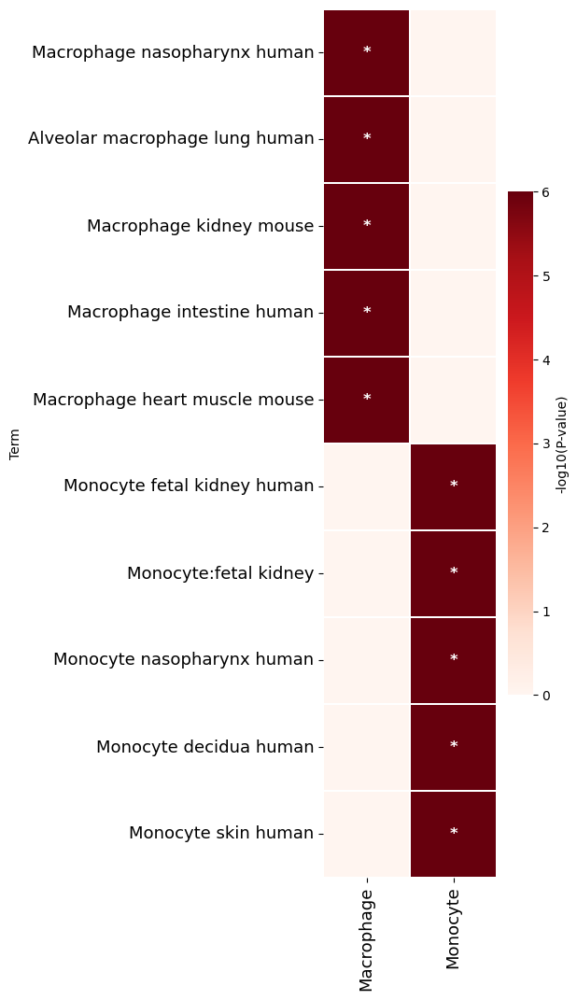

In [33]:
sc.pp.normalize_total(adata,target_sum=1e4) 
sc.pp.log1p(adata)
import pandas as pd
sc.tl.rank_genes_groups(adata, 'myeloid_subtype', method="wilcoxon",use_raw =False)
sc.tl.dendrogram(adata, groupby='myeloid_subtype')

result = adata.uns["rank_genes_groups"]
groups = result["names"].dtype.names

result_df = pd.DataFrame(
    {
        f"{group}_{key}": result[key][group]
        for group in groups
        for key in ["names", "pvals_adj", "logfoldchanges", "scores"]
    })
up_dict = {}
down_dict = {}

for group in groups:
    n_col = f"{group}_names"
    p_col = f"{group}_pvals_adj"
    l_col = f"{group}_logfoldchanges"
    s_col = f"{group}_scores"

    degs_sig = result_df[result_df[p_col] < 0.05]
    degs_up = degs_sig[degs_sig[l_col] > 1].sort_values(by=s_col, ascending=False)
    degs_dw = degs_sig[degs_sig[l_col] < -1].sort_values(by=s_col, ascending=True)
    up_dict[group] = degs_up[n_col].reset_index(drop=True)
    down_dict[group] = degs_dw[n_col].reset_index(drop=True)

df_merge_up = pd.concat(up_dict.values(), axis=1)
df_merge_up.columns = list(up_dict.keys())

df_merge_down = pd.concat(down_dict.values(), axis=1)
df_merge_down.columns = list(down_dict.keys())

sc.tl.dendrogram(adata, groupby='myeloid_subtype')

result = adata.uns["rank_genes_groups"]
groups = result["names"].dtype.names
result_df = pd.DataFrame(
    {
        f"{group}_{key}": result[key][group]
        for group in groups
        for key in ["names", "pvals_adj", "logfoldchanges", "scores"]
    }
)
up_dict = {}
down_dict = {}

for group in groups:
    n_col = f"{group}_names"
    p_col = f"{group}_pvals_adj"
    l_col = f"{group}_logfoldchanges"
    s_col = f"{group}_scores"
    degs_sig = result_df[result_df[p_col] < 0.05]
    degs_up = degs_sig[degs_sig[l_col] > 1].sort_values(by=s_col, ascending=False)
    degs_dw = degs_sig[degs_sig[l_col] < -1].sort_values(by=s_col, ascending=True)
    up_dict[group] = degs_up[n_col].reset_index(drop=True)
    down_dict[group] = degs_dw[n_col].reset_index(drop=True)

df_merge_up = pd.concat(up_dict.values(), axis=1)
df_merge_up.columns = list(up_dict.keys())

df_merge_down = pd.concat(down_dict.values(), axis=1)
df_merge_down.columns = list(down_dict.keys())

import sys
sys.path.append("/home/Data_Drive_8TB/kykim/QED")
from qed.data import readtxt, readseurat, readscanpy
from qed.data import get_enrichment_dataframes
from qed.data import merge_df
from qed.data import query
import inspect

import pandas as pd
class GeneSet:
    def __init__(self, genes, name, annot=None):
        self.genes = genes
        self.name = name
        self.params = {}
        self.GO = []
        self.annot = annot or {}
dblist = [
'CellMarker_2024','CellMarker_Augmented_2021',"PanglaoDB_Augmented_2021",    'KEGG_2021_Human',
    'Reactome_2022',
    'MSigDB_Hallmark_2020',
    'GO_Biological_Process_2023',
    'WikiPathway_2024_Human'
]

df_merge_up_100 = df_merge_up.head(20)
df_merge_up_100.to_csv('breast_cancer_DEG_up_leiden.csv', index=False, header=True)

alist = pd.read_csv('breast_cancer_DEG_up_leiden.csv')
geneset_list = []
for col in alist.columns:
    genes = alist[col].dropna().tolist()
    gs = GeneSet(genes=genes, name=col, annot={"Leiden": col})
    geneset_list.append(gs)

aalist = get_enrichment_dataframes(
    geneset_list=geneset_list,
    dblist=dblist,
    annot_colname="Leiden",
    n_jobs=None,
    handle_error=True,
    max_iter=1
)

df = merge_df(aalist)
df['Term'] = df['Term'].str.split(r'\(GO:').str[0].str.strip()
df['Term'] = df['Term'].str.split('R-H').str[0].str.strip()
df['Term'] = df['Term'].str.split('WP').str[0].str.strip()

from typing import List, Tuple, Dict
def heatmap_with_groupwise_ordering(df: pd.DataFrame,
                                     n: int,
                                     group_by: str,
                                     order_by: str = "Adjusted p-value",
                                     cmap: str = 'Blues',
                                     xlabel_rotation: int = 90,
                                     xlabel_fontsize: int = 15,
                                     ylabel_fontsize: int = 15,
                                     figsize: Tuple = (15, 10),
                                     vmin: float = None,
                                     vmax: float = None,
                                     cbar_kws: Dict = None,
                                     linewidths: float = 0.1,
                                     title: str = None,
                                     save_to_file: str = None,
                                     enable_column_order: bool = False,
                                     column_order: list = None,
                                     enable_highlight_columns: bool = False,
                                     highlight_column_names: list = None):

    if not isinstance(df, pd.DataFrame):
        raise TypeError("입력 'df'는 pandas DataFrame이어야 합니다.")
    if group_by not in df.columns:
        raise ValueError(f"'{group_by}' 컬럼이 DataFrame에 존재하지 않습니다.")
    if order_by not in df.columns:
        raise ValueError(f"'{order_by}' 컬럼이 DataFrame에 존재하지 않습니다.")
    if 'Term' not in df.columns:
        raise ValueError("'Term' 컬럼이 DataFrame에 존재하지 않습니다.")

    has_overlapping_genes = 'Overlapping genes' in df.columns

    # P-value 컬럼 숫자형 강제 변환
    df_copy = df.copy()
    df_copy[order_by] = pd.to_numeric(df_copy[order_by], errors='coerce')
    df = df_copy

    df['Term_lower'] = df['Term'].str.lower()

    # 상위 n개 Term 추출
    df_filtered_by_order = df[df[order_by].notna()]
    df_ranked_per_group = (
        df_filtered_by_order
        .sort_values(order_by)
        .groupby(group_by)
        .head(n)
        .reset_index(drop=True)
    )
    if df_ranked_per_group.empty:
        print(f"⚠️ 각 그룹에서 상위 {n}개의 Term을 선택할 수 없습니다.")
        return None, None

    all_selected_terms_lower = df_ranked_per_group['Term_lower'].unique()

    # Overlapping genes 처리
    overlapping_genes_pivot = pd.DataFrame()
    if has_overlapping_genes:
        overlapping_genes_df = df[df['Term_lower'].isin(all_selected_terms_lower)][['Term_lower', group_by, 'Overlapping genes']]
        overlapping_genes_df['Overlapping genes'] = overlapping_genes_df['Overlapping genes'].apply(
            lambda x: ', '.join(map(str, x)) if isinstance(x, list) else str(x)
        )
        overlapping_genes_df = overlapping_genes_df.groupby(['Term_lower', group_by])['Overlapping genes'].apply(', '.join).reset_index()
        overlapping_genes_df.rename(columns={'Term_lower': 'Term'}, inplace=True)
        overlapping_genes_pivot = overlapping_genes_df.pivot(index='Term', columns=group_by, values='Overlapping genes').fillna('')
        overlapping_genes_pivot.index = overlapping_genes_pivot.index.map(lambda x: x.capitalize())

    # P-value pivot table
    aggregated_df = df[df['Term_lower'].isin(all_selected_terms_lower)].groupby(['Term_lower', group_by], as_index=False)[order_by].min()
    aggregated_df.rename(columns={'Term_lower': 'Term'}, inplace=True)
    pivot_df = aggregated_df.pivot(index="Term", columns=group_by, values=order_by).fillna(1).rename_axis(None, axis=1)

    # Log 변환
    is_pvalue_column = order_by.lower() in ['adjusted p-value', 'p-value']
    pivot_df_for_heatmap = -np.log10(np.maximum(pivot_df, np.finfo(float).eps)) if is_pvalue_column else pivot_df.copy()
    pivot_df_for_heatmap.index = pivot_df_for_heatmap.index.map(lambda x: x.capitalize())

    # ✅ Overlapping genes와 결합
    final_pivot_df = pd.concat([pivot_df_for_heatmap, overlapping_genes_pivot], axis=1)

    if save_to_file:
        try:
            final_pivot_df.to_csv(save_to_file, encoding='utf-8-sig')
            print(f"✅ 히트맵 데이터 저장 완료: '{save_to_file}'")
        except Exception as e:
            print(f"❌ 저장 실패: {e}")

    # ✅ column_order 기준 row 정렬
    row_order = []
    seen_terms = set()

    if enable_column_order and column_order:
        group_order_for_plot = [group for group in column_order if group in df[group_by].unique()]
    else:
        group_order_for_plot = sorted(df[group_by].unique())  # ✅ X축 정렬에 맞춤

    # 🔑 Y축을 X축 순서에 맞춰 계단식으로 GO term 배치
    for group in group_order_for_plot:
        current_group_terms = (
            df_ranked_per_group[df_ranked_per_group[group_by] == group]
            .sort_values(order_by)
        )
        for term_lower_val in current_group_terms['Term_lower']:
            capitalized_term = term_lower_val.capitalize()
            if capitalized_term in pivot_df_for_heatmap.index and capitalized_term not in seen_terms:
                row_order.append(capitalized_term)
                seen_terms.add(capitalized_term)

    # row_order 적용
    clustered_data = final_pivot_df.loc[row_order]
    heatmap_data = clustered_data.select_dtypes(include=[np.number])
   # 1️⃣ 사용자 지정 column_order가 있으면 그 순서 적용
    if enable_column_order and column_order:
        valid_cols = [c for c in column_order if c in heatmap_data.columns]
        if valid_cols:
            heatmap_data = heatmap_data[valid_cols]

# 2️⃣ column_order가 없고, 열 이름이 전부 숫자로 해석 가능하면 오름차순 정렬
    else:
        try:
        # 모든 열 이름을 float으로 바꿔 보고 성공하면 오름차순 재정렬
            numeric_col_keys = [float(c) for c in heatmap_data.columns]
            sorted_cols = [col for _, col in sorted(zip(numeric_col_keys, heatmap_data.columns))]
            heatmap_data = heatmap_data[sorted_cols]
        except ValueError:
        # 열 이름이 숫자가 아닌 게 섞여 있으면 그대로 둡니다
            pass


    if is_pvalue_column:
        p_values_for_annotation = 10 ** (-np.clip(heatmap_data, None, 300))
        annotations = np.where(p_values_for_annotation <= 0.05, '*', '')
        annotations = annotations.astype(object)
    else:
        annotations = False

    # ✅ 열 강조 인덱스 계산 (선 추가)
    highlight_column_indices = []
    if enable_highlight_columns and highlight_column_names:
        highlight_column_indices = [
            list(heatmap_data.columns).index(col)
            for col in highlight_column_names if col in heatmap_data.columns
        ]

    # ✅ 시각화
    fig, ax = plt.subplots(figsize=figsize)
    sns.heatmap(heatmap_data, cmap=cmap, vmin=vmin, vmax=vmax,
                linewidths=linewidths, annot=annotations, fmt='',
                linecolor='white', ax=ax, cbar_kws=cbar_kws, square=True,
                annot_kws={"size": 12, "color": "white", "weight": "bold"})

    # 수직선 추가
    for x in highlight_column_indices:
        ax.vlines(x + 1, *ax.get_ylim(), colors='black', linewidth=2)

    plt.xticks(rotation=xlabel_rotation, fontsize=xlabel_fontsize)
    plt.yticks(fontsize=ylabel_fontsize)
    if title:
        ax.set_title(title, fontsize=18, pad=20)
    plt.grid(False)

    if 'Term_lower' in df.columns:
        df.drop(columns='Term_lower', inplace=True)

    return fig, ax
    
#df_filtered = df[df.apply(lambda x: str(x['Leiden']) in str(x['Term']), axis=1)]

df_filtered = df[
    df.apply(
        lambda x: any(t in x['Term'] for t in str(x['Leiden']).split()),
        axis=1)]

df_sorted = df_filtered.sort_values(by='Rank')

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

fig, ax = heatmap_with_groupwise_ordering(
    df= df_sorted,
    n=5,
    group_by='Leiden',
    order_by="Adjusted p-value",
    cmap='Reds',
    xlabel_rotation=90,
    xlabel_fontsize=13,
    ylabel_fontsize=13,
    figsize=(3, 14),
    vmin=0, vmax=6,
    cbar_kws={'shrink': 0.5, 'label': '-log10(P-value)'},
    enable_column_order=False,
   # column_order=[
   #     "Contractile cardiomyocyte", 
   #     "Myogenerative cardiomyocyte", 
   #     "Inflammatory cardiomyocyte"
   # ],
    enable_highlight_columns=False,
   # highlight_column_names=[
   #     "Contractile cardiomyocyte", 
   #     "Inflammatory cardiomyocyte"
   # ]
)

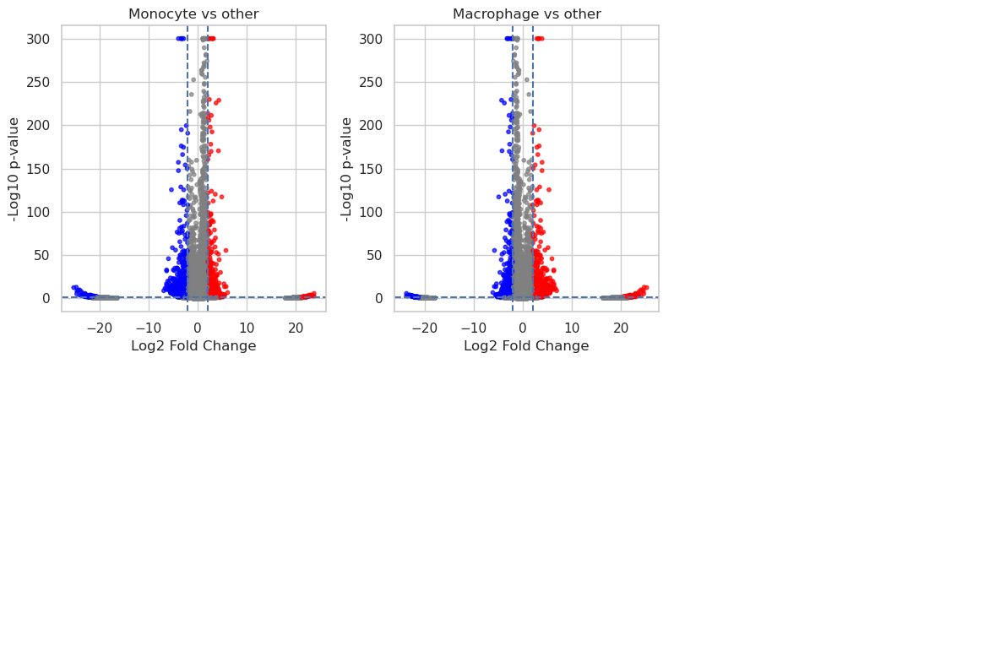

In [41]:
import scanpy as sc
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import ttest_ind

clusters = adata.obs['myeloid_subtype'].unique()[:5]

fig, axes = plt.subplots(2, 3, figsize=(12,8))
axes = axes.flatten()

for ax, target_cluster in zip(axes, clusters):
    adata_target = adata[adata.obs['myeloid_subtype'] == target_cluster]
    adata_other = adata[adata.obs['myeloid_subtype'] != target_cluster]

    X_target = adata_target.X.toarray() if hasattr(adata_target.X, "toarray") else adata_target.X
    X_other = adata_other.X.toarray() if hasattr(adata_other.X, "toarray") else adata_other.X

    mean_target = X_target.mean(axis=0)
    mean_other = X_other.mean(axis=0)

    lfc = np.log2(mean_target + 1e-9) - np.log2(mean_other + 1e-9)

    pvals = np.array([
        ttest_ind(X_target[:, i], X_other[:, i], equal_var=False).pvalue
        for i in range(adata.n_vars)
    ])

    neglog10_pval = -np.log10(pvals + 1e-300)

    colors = np.full(adata.n_vars, "grey", dtype=object)
    colors[(lfc > 2) & (pvals < 0.05)] = "red"
    colors[(lfc < -2) & (pvals < 0.05)] = "blue"

    ax.scatter(lfc, neglog10_pval, c=colors, alpha=0.7, s=10)
    ax.axhline(-np.log10(0.05), linestyle="--")
    ax.axvline(2, linestyle="--")
    ax.axvline(-2, linestyle="--")
    ax.set_title(f"{target_cluster} vs other")
    ax.set_xlabel("Log2 Fold Change")
    ax.set_ylabel("-Log10 p-value")

for ax in axes[len(clusters):]:
    ax.axis("off")

plt.tight_layout()
plt.show()

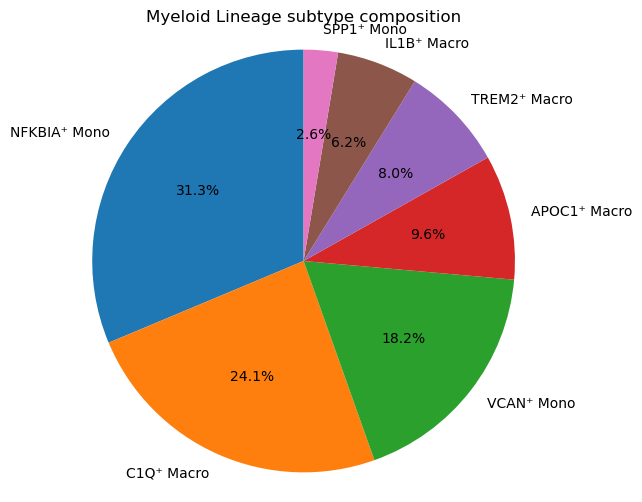

In [37]:
import matplotlib.pyplot as plt

counts = adata.obs['test'].value_counts()

plt.figure(figsize=(6,6))
plt.pie(
    counts.values,
    labels=counts.index,
    autopct='%1.1f%%',
    startangle=90
)
plt.axis('equal')
plt.title('Myeloid Lineage subtype composition')
plt.show()

In [8]:
##### Pathway analysis #####

In [39]:
sc.pp.normalize_total(adata,target_sum=1e4) 
sc.pp.log1p(adata)
import pandas as pd
sc.tl.rank_genes_groups(adata, 'test', method="wilcoxon",use_raw =False)
sc.tl.dendrogram(adata, groupby='test')

result = adata.uns["rank_genes_groups"]
groups = result["names"].dtype.names

result_df = pd.DataFrame(
    {
        f"{group}_{key}": result[key][group]
        for group in groups
        for key in ["names", "pvals_adj", "logfoldchanges", "scores"]
    })
up_dict = {}
down_dict = {}

for group in groups:
    n_col = f"{group}_names"
    p_col = f"{group}_pvals_adj"
    l_col = f"{group}_logfoldchanges"
    s_col = f"{group}_scores"

    degs_sig = result_df[result_df[p_col] < 0.05]
    degs_up = degs_sig[degs_sig[l_col] > 1].sort_values(by=s_col, ascending=False)
    degs_dw = degs_sig[degs_sig[l_col] < -1].sort_values(by=s_col, ascending=True)
    up_dict[group] = degs_up[n_col].reset_index(drop=True)
    down_dict[group] = degs_dw[n_col].reset_index(drop=True)

df_merge_up = pd.concat(up_dict.values(), axis=1)
df_merge_up.columns = list(up_dict.keys())

df_merge_down = pd.concat(down_dict.values(), axis=1)
df_merge_down.columns = list(down_dict.keys())

sc.tl.dendrogram(adata, groupby='test')

result = adata.uns["rank_genes_groups"]
groups = result["names"].dtype.names
result_df = pd.DataFrame(
    {
        f"{group}_{key}": result[key][group]
        for group in groups
        for key in ["names", "pvals_adj", "logfoldchanges", "scores"]
    }
)
up_dict = {}
down_dict = {}

for group in groups:
    n_col = f"{group}_names"
    p_col = f"{group}_pvals_adj"
    l_col = f"{group}_logfoldchanges"
    s_col = f"{group}_scores"
    degs_sig = result_df[result_df[p_col] < 0.05]
    degs_up = degs_sig[degs_sig[l_col] > 1].sort_values(by=s_col, ascending=False)
    degs_dw = degs_sig[degs_sig[l_col] < -1].sort_values(by=s_col, ascending=True)
    up_dict[group] = degs_up[n_col].reset_index(drop=True)
    down_dict[group] = degs_dw[n_col].reset_index(drop=True)

df_merge_up = pd.concat(up_dict.values(), axis=1)
df_merge_up.columns = list(up_dict.keys())

df_merge_down = pd.concat(down_dict.values(), axis=1)
df_merge_down.columns = list(down_dict.keys())

import sys
sys.path.append("/home/Data_Drive_8TB/kykim/QED")
from qed.data import readtxt, readseurat, readscanpy
from qed.data import get_enrichment_dataframes
from qed.data import merge_df
from qed.data import query
import inspect

import pandas as pd
class GeneSet:
    def __init__(self, genes, name, annot=None):
        self.genes = genes
        self.name = name
        self.params = {}
        self.GO = []
        self.annot = annot or {}
dblist = [
'CellMarker_2024','CellMarker_Augmented_2021',"PanglaoDB_Augmented_2021",    'KEGG_2021_Human',
    'Reactome_2022',
    'MSigDB_Hallmark_2020',
    'GO_Biological_Process_2023',
    'WikiPathway_2024_Human'
]

df_merge_up_100 = df_merge_up.head(20)
df_merge_up_100.to_csv('breast_cancer_DEG_up_leiden.csv', index=False, header=True)

alist = pd.read_csv('breast_cancer_DEG_up_leiden.csv')
geneset_list = []
for col in alist.columns:
    genes = alist[col].dropna().tolist()
    gs = GeneSet(genes=genes, name=col, annot={"Leiden": col})
    geneset_list.append(gs)

aalist = get_enrichment_dataframes(
    geneset_list=geneset_list,
    dblist=dblist,
    annot_colname="Leiden",
    n_jobs=None,
    handle_error=True,
    max_iter=1
)

df = merge_df(aalist)
df['Term'] = df['Term'].str.split(r'\(GO:').str[0].str.strip()
df['Term'] = df['Term'].str.split('R-H').str[0].str.strip()
df['Term'] = df['Term'].str.split('WP').str[0].str.strip()

from typing import List, Tuple, Dict
def heatmap_with_groupwise_ordering(df: pd.DataFrame,
                                     n: int,
                                     group_by: str,
                                     order_by: str = "Adjusted p-value",
                                     cmap: str = 'Blues',
                                     xlabel_rotation: int = 90,
                                     xlabel_fontsize: int = 15,
                                     ylabel_fontsize: int = 15,
                                     figsize: Tuple = (15, 10),
                                     vmin: float = None,
                                     vmax: float = None,
                                     cbar_kws: Dict = None,
                                     linewidths: float = 0.1,
                                     title: str = None,
                                     save_to_file: str = None,
                                     enable_column_order: bool = False,
                                     column_order: list = None,
                                     enable_highlight_columns: bool = False,
                                     highlight_column_names: list = None):

    if not isinstance(df, pd.DataFrame):
        raise TypeError("입력 'df'는 pandas DataFrame이어야 합니다.")
    if group_by not in df.columns:
        raise ValueError(f"'{group_by}' 컬럼이 DataFrame에 존재하지 않습니다.")
    if order_by not in df.columns:
        raise ValueError(f"'{order_by}' 컬럼이 DataFrame에 존재하지 않습니다.")
    if 'Term' not in df.columns:
        raise ValueError("'Term' 컬럼이 DataFrame에 존재하지 않습니다.")

    has_overlapping_genes = 'Overlapping genes' in df.columns

    # P-value 컬럼 숫자형 강제 변환
    df_copy = df.copy()
    df_copy[order_by] = pd.to_numeric(df_copy[order_by], errors='coerce')
    df = df_copy

    df['Term_lower'] = df['Term'].str.lower()

    # 상위 n개 Term 추출
    df_filtered_by_order = df[df[order_by].notna()]
    df_ranked_per_group = (
        df_filtered_by_order
        .sort_values(order_by)
        .groupby(group_by)
        .head(n)
        .reset_index(drop=True)
    )
    if df_ranked_per_group.empty:
        print(f"⚠️ 각 그룹에서 상위 {n}개의 Term을 선택할 수 없습니다.")
        return None, None

    all_selected_terms_lower = df_ranked_per_group['Term_lower'].unique()

    # Overlapping genes 처리
    overlapping_genes_pivot = pd.DataFrame()
    if has_overlapping_genes:
        overlapping_genes_df = df[df['Term_lower'].isin(all_selected_terms_lower)][['Term_lower', group_by, 'Overlapping genes']]
        overlapping_genes_df['Overlapping genes'] = overlapping_genes_df['Overlapping genes'].apply(
            lambda x: ', '.join(map(str, x)) if isinstance(x, list) else str(x)
        )
        overlapping_genes_df = overlapping_genes_df.groupby(['Term_lower', group_by])['Overlapping genes'].apply(', '.join).reset_index()
        overlapping_genes_df.rename(columns={'Term_lower': 'Term'}, inplace=True)
        overlapping_genes_pivot = overlapping_genes_df.pivot(index='Term', columns=group_by, values='Overlapping genes').fillna('')
        overlapping_genes_pivot.index = overlapping_genes_pivot.index.map(lambda x: x.capitalize())

    # P-value pivot table
    aggregated_df = df[df['Term_lower'].isin(all_selected_terms_lower)].groupby(['Term_lower', group_by], as_index=False)[order_by].min()
    aggregated_df.rename(columns={'Term_lower': 'Term'}, inplace=True)
    pivot_df = aggregated_df.pivot(index="Term", columns=group_by, values=order_by).fillna(1).rename_axis(None, axis=1)

    # Log 변환
    is_pvalue_column = order_by.lower() in ['adjusted p-value', 'p-value']
    pivot_df_for_heatmap = -np.log10(np.maximum(pivot_df, np.finfo(float).eps)) if is_pvalue_column else pivot_df.copy()
    pivot_df_for_heatmap.index = pivot_df_for_heatmap.index.map(lambda x: x.capitalize())

    # ✅ Overlapping genes와 결합
    final_pivot_df = pd.concat([pivot_df_for_heatmap, overlapping_genes_pivot], axis=1)

    if save_to_file:
        try:
            final_pivot_df.to_csv(save_to_file, encoding='utf-8-sig')
            print(f"✅ 히트맵 데이터 저장 완료: '{save_to_file}'")
        except Exception as e:
            print(f"❌ 저장 실패: {e}")

    # ✅ column_order 기준 row 정렬
    row_order = []
    seen_terms = set()

    if enable_column_order and column_order:
        group_order_for_plot = [group for group in column_order if group in df[group_by].unique()]
    else:
        group_order_for_plot = sorted(df[group_by].unique())  # ✅ X축 정렬에 맞춤

    # 🔑 Y축을 X축 순서에 맞춰 계단식으로 GO term 배치
    for group in group_order_for_plot:
        current_group_terms = (
            df_ranked_per_group[df_ranked_per_group[group_by] == group]
            .sort_values(order_by)
        )
        for term_lower_val in current_group_terms['Term_lower']:
            capitalized_term = term_lower_val.capitalize()
            if capitalized_term in pivot_df_for_heatmap.index and capitalized_term not in seen_terms:
                row_order.append(capitalized_term)
                seen_terms.add(capitalized_term)

    # row_order 적용
    clustered_data = final_pivot_df.loc[row_order]
    heatmap_data = clustered_data.select_dtypes(include=[np.number])
   # 1️⃣ 사용자 지정 column_order가 있으면 그 순서 적용
    if enable_column_order and column_order:
        valid_cols = [c for c in column_order if c in heatmap_data.columns]
        if valid_cols:
            heatmap_data = heatmap_data[valid_cols]

# 2️⃣ column_order가 없고, 열 이름이 전부 숫자로 해석 가능하면 오름차순 정렬
    else:
        try:
        # 모든 열 이름을 float으로 바꿔 보고 성공하면 오름차순 재정렬
            numeric_col_keys = [float(c) for c in heatmap_data.columns]
            sorted_cols = [col for _, col in sorted(zip(numeric_col_keys, heatmap_data.columns))]
            heatmap_data = heatmap_data[sorted_cols]
        except ValueError:
        # 열 이름이 숫자가 아닌 게 섞여 있으면 그대로 둡니다
            pass


    if is_pvalue_column:
        p_values_for_annotation = 10 ** (-np.clip(heatmap_data, None, 300))
        annotations = np.where(p_values_for_annotation <= 0.05, '*', '')
        annotations = annotations.astype(object)
    else:
        annotations = False

    # ✅ 열 강조 인덱스 계산 (선 추가)
    highlight_column_indices = []
    if enable_highlight_columns and highlight_column_names:
        highlight_column_indices = [
            list(heatmap_data.columns).index(col)
            for col in highlight_column_names if col in heatmap_data.columns
        ]

    # ✅ 시각화
    fig, ax = plt.subplots(figsize=figsize)
    sns.heatmap(heatmap_data, cmap=cmap, vmin=vmin, vmax=vmax,
                linewidths=linewidths, annot=annotations, fmt='',
                linecolor='white', ax=ax, cbar_kws=cbar_kws, square=True,
                annot_kws={"size": 12, "color": "white", "weight": "bold"})

    # 수직선 추가
    for x in highlight_column_indices:
        ax.vlines(x + 1, *ax.get_ylim(), colors='black', linewidth=2)

    plt.xticks(rotation=xlabel_rotation, fontsize=xlabel_fontsize)
    plt.yticks(fontsize=ylabel_fontsize)
    if title:
        ax.set_title(title, fontsize=18, pad=20)
    plt.grid(False)

    if 'Term_lower' in df.columns:
        df.drop(columns='Term_lower', inplace=True)

    return fig, ax

Processing genesets: 13it [00:01, 11.82it/s]                      

Error processing APOC1⁺ Macro for WikiPathway_2024_Human: 'WikiPathway_2024_Human'Error processing C1Q⁺ Macro for WikiPathway_2024_Human: 'WikiPathway_2024_Human'

Error processing IL1B⁺ Macro for WikiPathway_2024_Human: 'WikiPathway_2024_Human'
Error processing NFKBIA⁺ Mono for WikiPathway_2024_Human: 'WikiPathway_2024_Human'


Processing genesets: 40it [00:02, 15.77it/s]

Error processing SPP1⁺ Mono for WikiPathway_2024_Human: 'WikiPathway_2024_Human'
Error processing TREM2⁺ Macro for WikiPathway_2024_Human: 'WikiPathway_2024_Human'


Processing genesets: 55it [00:03, 26.69it/s]

Error processing VCAN⁺ Mono for WikiPathway_2024_Human: 'WikiPathway_2024_Human'


Processing genesets: 56it [00:03, 16.87it/s]


Trying to re-request...
Error processing APOC1⁺ Macro for WikiPathway_2024_Human: 'WikiPathway_2024_Human'
APOC1⁺ Macro with WikiPathway_2024_Human completed!
Error processing C1Q⁺ Macro for WikiPathway_2024_Human: 'WikiPathway_2024_Human'
C1Q⁺ Macro with WikiPathway_2024_Human completed!
Error processing IL1B⁺ Macro for WikiPathway_2024_Human: 'WikiPathway_2024_Human'
IL1B⁺ Macro with WikiPathway_2024_Human completed!
Error processing NFKBIA⁺ Mono for WikiPathway_2024_Human: 'WikiPathway_2024_Human'
NFKBIA⁺ Mono with WikiPathway_2024_Human completed!
Error processing SPP1⁺ Mono for WikiPathway_2024_Human: 'WikiPathway_2024_Human'
SPP1⁺ Mono with WikiPathway_2024_Human completed!
Error processing TREM2⁺ Macro for WikiPathway_2024_Human: 'WikiPathway_2024_Human'
TREM2⁺ Macro with WikiPathway_2024_Human completed!
Error processing VCAN⁺ Mono for WikiPathway_2024_Human: 'WikiPathway_2024_Human'
VCAN⁺ Mono with WikiPathway_2024_Human completed!


In [41]:
df.to_csv("/home/Data_Drive_8TB/kykim/5. CRC (Myeloid)/pathway_mono_macro.csv", index=False)

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

fig, ax = heatmap_with_groupwise_ordering(
    df= df_sorted,
    n=5,
    group_by='Leiden',
    order_by="Adjusted p-value",
    cmap='Reds',
    xlabel_rotation=90,
    xlabel_fontsize=13,
    ylabel_fontsize=13,
    figsize=(3, 14),
    vmin=0, vmax=6,
    cbar_kws={'shrink': 0.5, 'label': '-log10(P-value)'},
    enable_column_order=False,
   # column_order=[
   #     "Contractile cardiomyocyte", 
   #     "Myogenerative cardiomyocyte", 
   #     "Inflammatory cardiomyocyte"
   # ],
    enable_highlight_columns=False,
   # highlight_column_names=[
   #     "Contractile cardiomyocyte", 
   #     "Inflammatory cardiomyocyte"
   # ]
)

In [36]:
import sys
sys.path.append("/home/Data_Drive_8TB/kykim/QED")
from qed.data import readtxt, readseurat, readscanpy
from qed.data import get_enrichment_dataframes
from qed.data import merge_df
from qed.data import query
import inspect

import pandas as pd
class GeneSet:
    def __init__(self, genes, name, annot=None):
        self.genes = genes
        self.name = name
        self.params = {}
        self.GO = []
        self.annot = annot or {}
dblist = [
    'KEGG_2021_Human',
    'Reactome_2022', 'Mouse_Gene_Atlas',
    'MSigDB_Hallmark_2020',
    'GO_Biological_Process_2023',
    'WikiPathway_2024_Human','WikiPathways_2024_Mouse','KEGG_2019_Mouse']

df_merge_up_100 = df_merge_up.head(20)
df_merge_up_100.to_csv('breast_cancer_DEG_up_leiden.csv', index=False, header=True)

alist = pd.read_csv('breast_cancer_DEG_up_leiden.csv')
geneset_list = []
for col in alist.columns:
    genes = alist[col].dropna().tolist()
    gs = GeneSet(genes=genes, name=col, annot={"Leiden": col})
    geneset_list.append(gs)

aalist = get_enrichment_dataframes(
    geneset_list=geneset_list,
    dblist=dblist,
    annot_colname="Leiden",
    n_jobs=None,
    handle_error=True,
    max_iter=1
)

df = merge_df(aalist)
df['Term'] = df['Term'].str.split(r'\(GO:').str[0].str.strip()
df['Term'] = df['Term'].str.split('R-H').str[0].str.strip()
df['Term'] = df['Term'].str.split('WP').str[0].str.strip()

Processing genesets: 12it [00:01, 11.04it/s]                      

Error processing Monocyte for WikiPathway_2024_Human: 'WikiPathway_2024_Human'
Error processing Macrophage for WikiPathway_2024_Human: 'WikiPathway_2024_Human'


Processing genesets: 16it [00:01,  9.23it/s]


Trying to re-request...
Error processing Macrophage for WikiPathway_2024_Human: 'WikiPathway_2024_Human'
Macrophage with WikiPathway_2024_Human completed!
Error processing Monocyte for WikiPathway_2024_Human: 'WikiPathway_2024_Human'
Monocyte with WikiPathway_2024_Human completed!


In [71]:
from typing import List, Tuple, Dict
def heatmap_with_groupwise_ordering(df: pd.DataFrame,
                                     n: int,
                                     group_by: str,
                                     order_by: str = "Adjusted p-value",
                                     cmap: str = 'Blues',
                                     xlabel_rotation: int = 90,
                                     xlabel_fontsize: int = 15,
                                     ylabel_fontsize: int = 15,
                                     figsize: Tuple = (15, 10),
                                     vmin: float = None,
                                     vmax: float = None,
                                     cbar_kws: Dict = None,
                                     linewidths: float = 0.1,
                                     title: str = None,
                                     save_to_file: str = None,
                                     enable_column_order: bool = False,
                                     column_order: list = None,
                                     enable_highlight_columns: bool = False,
                                     highlight_column_names: list = None):

    if not isinstance(df, pd.DataFrame):
        raise TypeError("입력 'df'는 pandas DataFrame이어야 합니다.")
    if group_by not in df.columns:
        raise ValueError(f"'{group_by}' 컬럼이 DataFrame에 존재하지 않습니다.")
    if order_by not in df.columns:
        raise ValueError(f"'{order_by}' 컬럼이 DataFrame에 존재하지 않습니다.")
    if 'Term' not in df.columns:
        raise ValueError("'Term' 컬럼이 DataFrame에 존재하지 않습니다.")

    has_overlapping_genes = 'Overlapping genes' in df.columns

    # P-value 컬럼 숫자형 강제 변환
    df_copy = df.copy()
    df_copy[order_by] = pd.to_numeric(df_copy[order_by], errors='coerce')
    df = df_copy

    df['Term_lower'] = df['Term'].str.lower()

    # 상위 n개 Term 추출
    df_filtered_by_order = df[df[order_by].notna()]
    df_ranked_per_group = (
        df_filtered_by_order
        .sort_values(order_by)
        .groupby(group_by)
        .head(n)
        .reset_index(drop=True)
    )
    if df_ranked_per_group.empty:
        print(f"⚠️ 각 그룹에서 상위 {n}개의 Term을 선택할 수 없습니다.")
        return None, None

    all_selected_terms_lower = df_ranked_per_group['Term_lower'].unique()

    # Overlapping genes 처리
    overlapping_genes_pivot = pd.DataFrame()
    if has_overlapping_genes:
        overlapping_genes_df = df[df['Term_lower'].isin(all_selected_terms_lower)][['Term_lower', group_by, 'Overlapping genes']]
        overlapping_genes_df['Overlapping genes'] = overlapping_genes_df['Overlapping genes'].apply(
            lambda x: ', '.join(map(str, x)) if isinstance(x, list) else str(x)
        )
        overlapping_genes_df = overlapping_genes_df.groupby(['Term_lower', group_by])['Overlapping genes'].apply(', '.join).reset_index()
        overlapping_genes_df.rename(columns={'Term_lower': 'Term'}, inplace=True)
        overlapping_genes_pivot = overlapping_genes_df.pivot(index='Term', columns=group_by, values='Overlapping genes').fillna('')
        overlapping_genes_pivot.index = overlapping_genes_pivot.index.map(lambda x: x.capitalize())

    # P-value pivot table
    aggregated_df = df[df['Term_lower'].isin(all_selected_terms_lower)].groupby(['Term_lower', group_by], as_index=False)[order_by].min()
    aggregated_df.rename(columns={'Term_lower': 'Term'}, inplace=True)
    pivot_df = aggregated_df.pivot(index="Term", columns=group_by, values=order_by).fillna(1).rename_axis(None, axis=1)

    # Log 변환
    is_pvalue_column = order_by.lower() in ['adjusted p-value', 'p-value']
    pivot_df_for_heatmap = -np.log10(np.maximum(pivot_df, np.finfo(float).eps)) if is_pvalue_column else pivot_df.copy()
    pivot_df_for_heatmap.index = pivot_df_for_heatmap.index.map(lambda x: x.capitalize())

    # ✅ Overlapping genes와 결합
    final_pivot_df = pd.concat([pivot_df_for_heatmap, overlapping_genes_pivot], axis=1)

    if save_to_file:
        try:
            final_pivot_df.to_csv(save_to_file, encoding='utf-8-sig')
            print(f"✅ 히트맵 데이터 저장 완료: '{save_to_file}'")
        except Exception as e:
            print(f"❌ 저장 실패: {e}")

    # ✅ column_order 기준 row 정렬
    row_order = []
    seen_terms = set()

    if enable_column_order and column_order:
        group_order_for_plot = [group for group in column_order if group in df[group_by].unique()]
    else:
        group_order_for_plot = sorted(df[group_by].unique())  # ✅ X축 정렬에 맞춤

    # 🔑 Y축을 X축 순서에 맞춰 계단식으로 GO term 배치
    for group in group_order_for_plot:
        current_group_terms = (
            df_ranked_per_group[df_ranked_per_group[group_by] == group]
            .sort_values(order_by)
        )
        for term_lower_val in current_group_terms['Term_lower']:
            capitalized_term = term_lower_val.capitalize()
            if capitalized_term in pivot_df_for_heatmap.index and capitalized_term not in seen_terms:
                row_order.append(capitalized_term)
                seen_terms.add(capitalized_term)

    # row_order 적용
    clustered_data = final_pivot_df.loc[row_order]
    heatmap_data = clustered_data.select_dtypes(include=[np.number])
   # 1️⃣ 사용자 지정 column_order가 있으면 그 순서 적용
    if enable_column_order and column_order:
        valid_cols = [c for c in column_order if c in heatmap_data.columns]
        if valid_cols:
            heatmap_data = heatmap_data[valid_cols]

# 2️⃣ column_order가 없고, 열 이름이 전부 숫자로 해석 가능하면 오름차순 정렬
    else:
        try:
        # 모든 열 이름을 float으로 바꿔 보고 성공하면 오름차순 재정렬
            numeric_col_keys = [float(c) for c in heatmap_data.columns]
            sorted_cols = [col for _, col in sorted(zip(numeric_col_keys, heatmap_data.columns))]
            heatmap_data = heatmap_data[sorted_cols]
        except ValueError:
        # 열 이름이 숫자가 아닌 게 섞여 있으면 그대로 둡니다
            pass


    if is_pvalue_column:
        p_values_for_annotation = 10 ** (-np.clip(heatmap_data, None, 300))
        annotations = np.where(p_values_for_annotation <= 0.05, '*', '')
        annotations = annotations.astype(object)
    else:
        annotations = False

    # ✅ 열 강조 인덱스 계산 (선 추가)
    highlight_column_indices = []
    if enable_highlight_columns and highlight_column_names:
        highlight_column_indices = [
            list(heatmap_data.columns).index(col)
            for col in highlight_column_names if col in heatmap_data.columns
        ]

    # ✅ 시각화
    fig, ax = plt.subplots(figsize=figsize)
    sns.heatmap(heatmap_data, cmap=cmap, vmin=vmin, vmax=vmax,
                linewidths=linewidths, annot=annotations, fmt='',
                linecolor='white', ax=ax, cbar_kws=cbar_kws, square=True,
                annot_kws={"size": 12, "color": "white", "weight": "bold"})

    # 수직선 추가
    for x in highlight_column_indices:
        ax.vlines(x + 1, *ax.get_ylim(), colors='black', linewidth=2)

    plt.xticks(rotation=xlabel_rotation, fontsize=xlabel_fontsize)
    plt.yticks(fontsize=ylabel_fontsize)
    if title:
        ax.set_title(title, fontsize=18, pad=20)
    plt.grid(False)

    if 'Term_lower' in df.columns:
        df.drop(columns='Term_lower', inplace=True)

    return fig, ax

In [72]:
# df = df[df['Term'].str.contains('negative', case=False, na=False)]

In [73]:
mask_exclude = df['Leiden'].isin(['C1Q⁺ Macro','IL1B⁺ Macro', 'NFKBIA⁺ Mono'])
df = df[mask_exclude | df['Term'].str.contains('negative', case=False, na=False)]

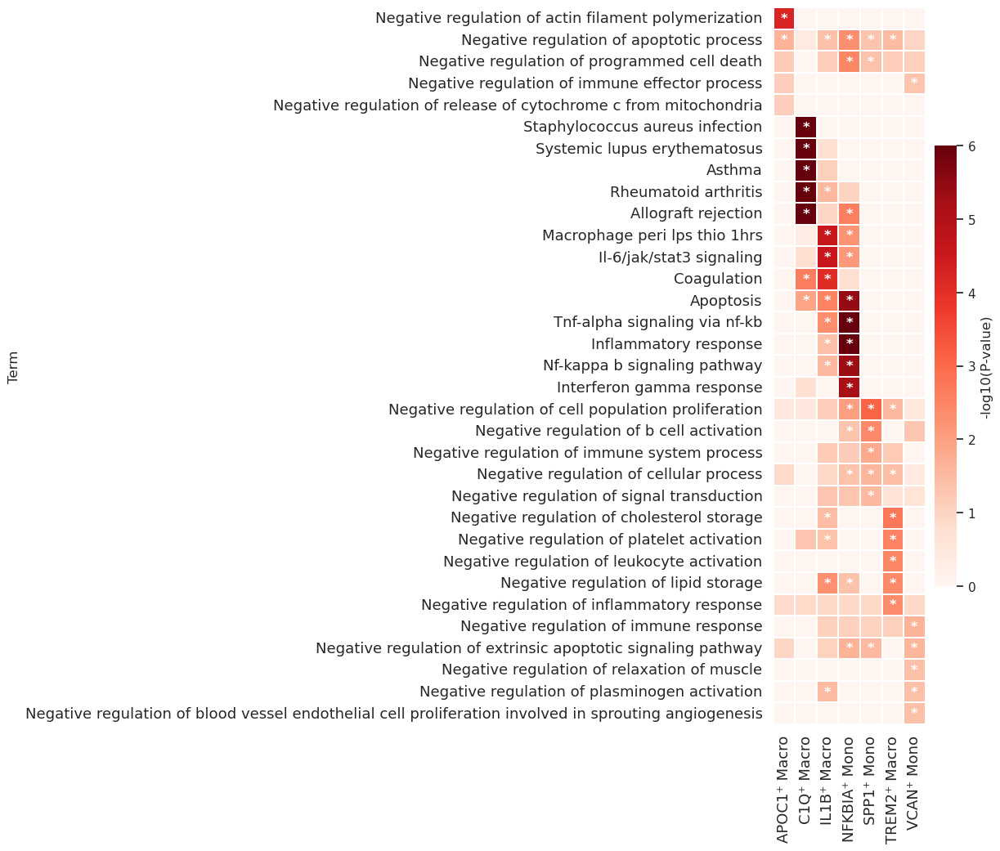

In [74]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

fig, ax = heatmap_with_groupwise_ordering(
    df= df,
    n=5,
    group_by='Leiden',
    order_by="Adjusted p-value",
    cmap='Reds',
    xlabel_rotation=90,
    xlabel_fontsize=13,
    ylabel_fontsize=13,
    figsize=(3, 14),
    vmin=0, vmax=6,
    cbar_kws={'shrink': 0.5, 'label': '-log10(P-value)'},
    enable_column_order=False,
   # column_order=[
   #     "Contractile cardiomyocyte", 
   #     "Myogenerative cardiomyocyte", 
   #     "Inflammatory cardiomyocyte"
   # ],
    enable_highlight_columns=False,
   # highlight_column_names=[
   #     "Contractile cardiomyocyte", 
   #     "Inflammatory cardiomyocyte"
   # ]
)

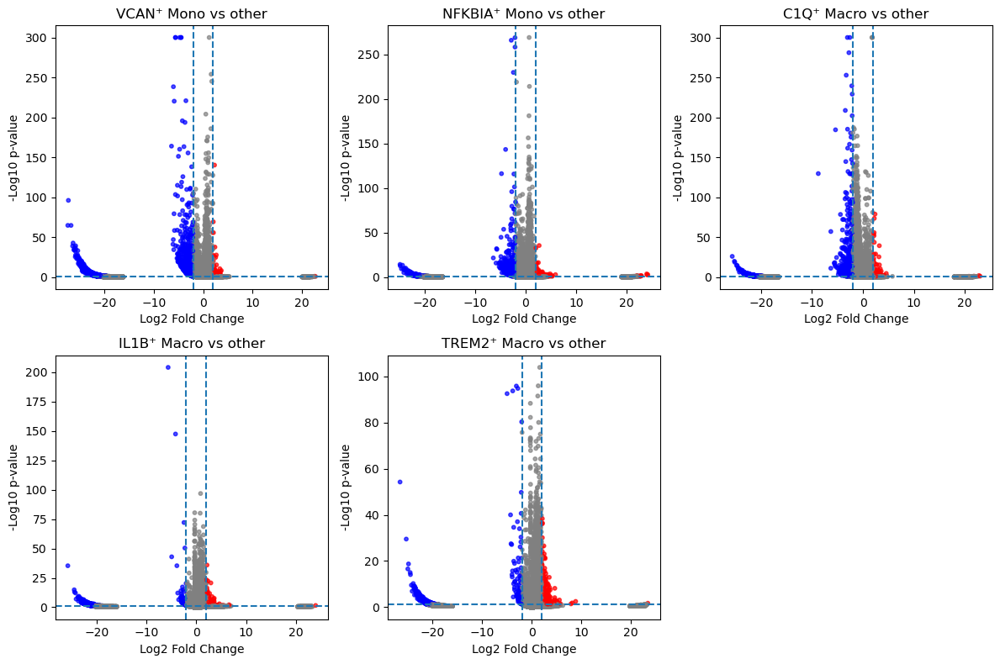

In [325]:
import scanpy as sc
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import ttest_ind

clusters = adata.obs['test'].unique()[:5]

fig, axes = plt.subplots(2, 3, figsize=(12,8))
axes = axes.flatten()

for ax, target_cluster in zip(axes, clusters):
    adata_target = adata[adata.obs['test'] == target_cluster]
    adata_other = adata[adata.obs['test'] != target_cluster]

    X_target = adata_target.X.toarray() if hasattr(adata_target.X, "toarray") else adata_target.X
    X_other = adata_other.X.toarray() if hasattr(adata_other.X, "toarray") else adata_other.X

    mean_target = X_target.mean(axis=0)
    mean_other = X_other.mean(axis=0)

    lfc = np.log2(mean_target + 1e-9) - np.log2(mean_other + 1e-9)

    pvals = np.array([
        ttest_ind(X_target[:, i], X_other[:, i], equal_var=False).pvalue
        for i in range(adata.n_vars)
    ])

    neglog10_pval = -np.log10(pvals + 1e-300)

    colors = np.full(adata.n_vars, "grey", dtype=object)
    colors[(lfc > 2) & (pvals < 0.05)] = "red"
    colors[(lfc < -2) & (pvals < 0.05)] = "blue"

    ax.scatter(lfc, neglog10_pval, c=colors, alpha=0.7, s=10)
    ax.axhline(-np.log10(0.05), linestyle="--")
    ax.axvline(2, linestyle="--")
    ax.axvline(-2, linestyle="--")
    ax.set_title(f"{target_cluster} vs other")
    ax.set_xlabel("Log2 Fold Change")
    ax.set_ylabel("-Log10 p-value")

for ax in axes[len(clusters):]:
    ax.axis("off")

plt.tight_layout()
plt.show()

In [326]:
##### Proportion #####

<Figure size 800x500 with 0 Axes>

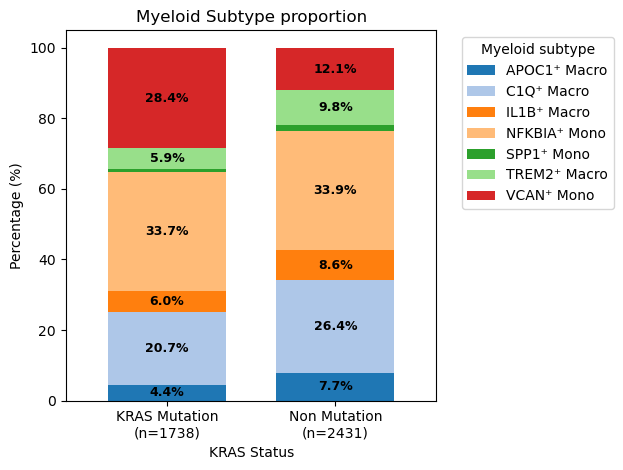

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
adata.obs['KRAS_mutation'] = adata.obs['KRAS'].apply(lambda x: "Non Mutation" if x == "-" else "KRAS Mutation")

counts = pd.crosstab(adata.obs['KRAS_mutation'], adata.obs['test'])
percentage = counts.div(counts.sum(axis=1), axis=0) * 100

colors = plt.cm.tab20.colors
plt.figure(figsize=(8,5))
ax = percentage.plot(kind='bar', stacked=True, color=colors, width=0.7)

plt.ylabel("Percentage (%)")
plt.xlabel("KRAS Status")
plt.title("Myeloid Subtype proportion")
plt.legend(title='Myeloid subtype', bbox_to_anchor=(1.05, 1), loc='upper left')
total_counts = counts.sum(axis=1)
xticks_labels = [f"{kr}\n(n={total_counts[kr]})" for kr in counts.index]
ax.set_xticklabels(xticks_labels, rotation=0)
for i, (idx, row) in enumerate(percentage.iterrows()):
    cumulative = 0
    for j, value in enumerate(row):
        if value > 3:
            ax.text(
                i, cumulative + value / 2,
                f"{value:.1f}%",
                ha='center', va='center', color='black', fontsize=9, fontweight='bold'
            )
        cumulative += value

plt.tight_layout()
plt.show()

<Figure size 800x500 with 0 Axes>

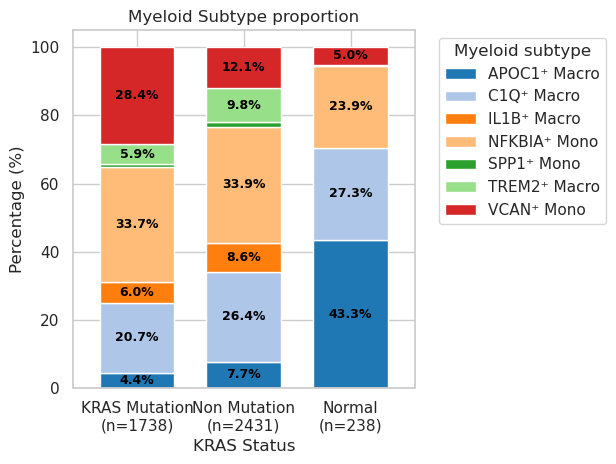

In [6]:
import pandas as pd
import matplotlib.pyplot as plt

counts = pd.crosstab(adata.obs['KRAS_mutation'], adata.obs['test'])
percentage = counts.div(counts.sum(axis=1), axis=0) * 100

colors = plt.cm.tab20.colors
plt.figure(figsize=(8,5))
ax = percentage.plot(kind='bar', stacked=True, color=colors, width=0.7)

plt.ylabel("Percentage (%)")
plt.xlabel("KRAS Status")
plt.title("Myeloid Subtype proportion")
plt.legend(title='Myeloid subtype', bbox_to_anchor=(1.05, 1), loc='upper left')
total_counts = counts.sum(axis=1)
xticks_labels = [f"{kr}\n(n={total_counts[kr]})" for kr in counts.index]
ax.set_xticklabels(xticks_labels, rotation=0)
for i, (idx, row) in enumerate(percentage.iterrows()):
    cumulative = 0
    for j, value in enumerate(row):
        if value > 3:
            ax.text(
                i, cumulative + value / 2,
                f"{value:.1f}%",
                ha='center', va='center', color='black', fontsize=9, fontweight='bold'
            )
        cumulative += value

plt.tight_layout()
plt.show()

In [6]:
sc.pp.normalize_total(adata,target_sum=1e4) 
sc.pp.log1p(adata)

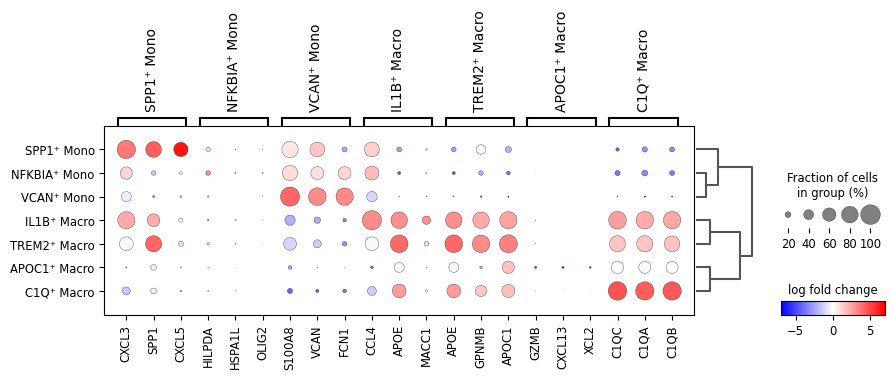

In [17]:
sc.pl.rank_genes_groups_dotplot(
    adata,
    n_genes=3,
    values_to_plot="logfoldchanges",
    min_logfoldchange=3,
    vmax=7,
    vmin=-7,
    cmap="bwr",
)

# Neutrophil subtype

In [1]:
import scanpy as sc
adata = sc.read_h5ad("/home/Data_Drive_8TB/kykim/5. CRC (Myeloid)/Mye_raw_H5ad/total_after_clustering_data.h5ad")

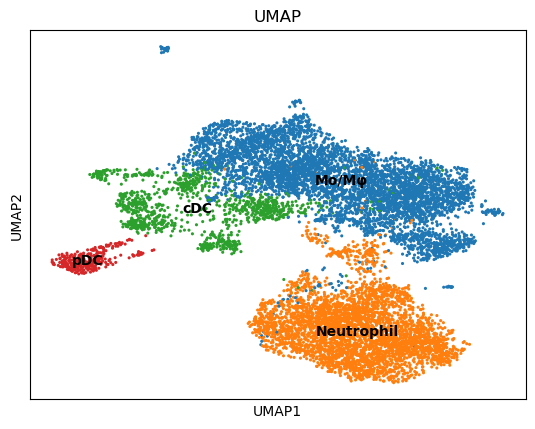

In [2]:
sc.pl.umap(
    adata,
    color='myeloid_subtype',
    title='UMAP',
    legend_loc='on data'
    , s = 20
)

In [3]:
adata = adata[adata.obs['myeloid_subtype'] == 'Neutrophil'].copy()

In [4]:
adata.raw = adata.copy()

/home/Data_Drive_8TB/kykim/.conda/envs/kykim/lib/python3.9/site-packages/scanpy/preprocessing/_highly_variable_genes.py:75: UserWarning: `flavor='seurat_v3'` expects raw count data, but non-integers were found.
  warnings.warn(


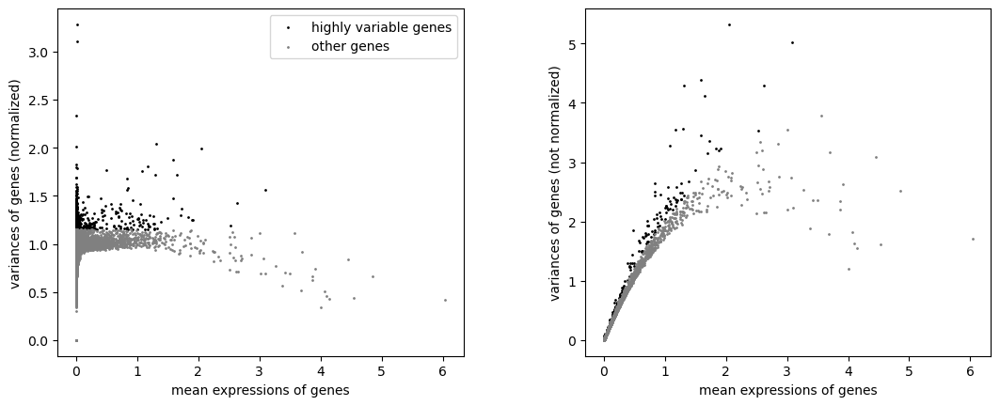

In [5]:
sc.pp.highly_variable_genes(adata, flavor='seurat_v3',n_top_genes=2000)
sc.pl.highly_variable_genes(adata)

In [6]:
adata = adata[:, adata.var.highly_variable].copy()

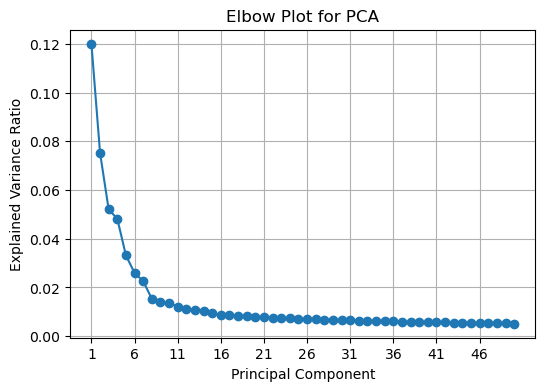

In [7]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

sc.tl.pca(adata)
explained_variance_ratio = adata.uns["pca"]["variance_ratio"]

plt.figure(figsize=(6, 4))
plt.plot(range(1, len(explained_variance_ratio) + 1), explained_variance_ratio, marker="o", linestyle="-")
plt.xlabel("Principal Component")
plt.ylabel("Explained Variance Ratio")
plt.title("Elbow Plot for PCA")
plt.xticks(np.arange(1, len(explained_variance_ratio) + 1, step=5))
plt.grid()
plt.show()

In [8]:
sc.tl.pca(adata, n_comps=6, svd_solver='arpack')

/home/Data_Drive_8TB/kykim/.conda/envs/kykim/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


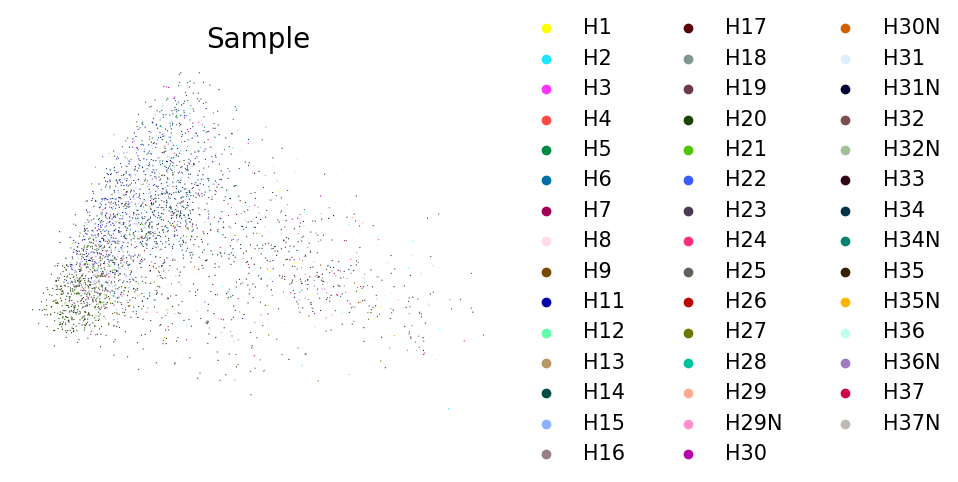

In [9]:
sc.pl.pca(
    adata,
    color=['sample'],
    frameon=False,
    size= 3,
    legend_fontsize=15,
    legend_fontoutline=3,
    title="CluVar UMAP",
    show=False)
plt.title("Sample", fontsize=20)
sc.pp.neighbors(adata)
adata.X = adata.X.astype(np.float32)
sc.tl.pca(adata, svd_solver="arpack", n_comps=50)
sc.pp.neighbors(adata, use_rep="X_pca", n_neighbors=15, n_pcs=50)
sc.tl.umap(adata)

In [10]:
import scvi 

scvi.model.SCVI.setup_anndata(adata, batch_key="sample")
vae = scvi.model.SCVI(adata, n_layers=2, n_latent=30, gene_likelihood="nb")

vae.train(max_epochs=400, early_stopping=True, early_stopping_patience=10)

An NVIDIA GPU may be present on this machine, but a CUDA-enabled jaxlib is not installed. Falling back to cpu.
/home/Data_Drive_8TB/kykim/.conda/envs/kykim/lib/python3.9/site-packages/scvi/data/fields/_base_field.py:64: UserWarning: adata.X does not contain unnormalized count data. Are you sure this is what you want?
  self.validate_field(adata)
/home/Data_Drive_8TB/kykim/.conda/envs/kykim/lib/python3.9/site-packages/scvi/data/fields/_dataframe_field.py:186: UserWarning: Category 5 in adata.obs['_scvi_batch'] has fewer than 3 cells. Models may not train properly.
  categorical_mapping = _make_column_categorical(
Trainer will use only 1 of 2 GPUs because it is running inside an interactive / notebook environment. You may try to set `Trainer(devices=2)` but please note that multi-GPU inside interactive / notebook environments is considered experimental and unstable. Your mileage may vary.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
You are using a CUDA

Epoch 20/400:   5%|▌         | 20/400 [00:07<02:14,  2.82it/s, v_num=1, train_loss_step=168, train_loss_epoch=160]
Monitored metric elbo_validation did not improve in the last 10 records. Best score: 203.182. Signaling Trainer to stop.


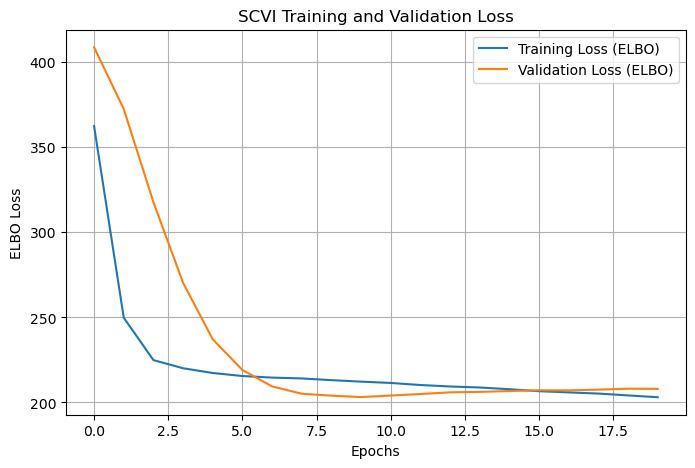

In [13]:
import matplotlib.pyplot as plt

train_loss = vae.history["elbo_train"]
val_loss = vae.history["elbo_validation"]
plt.figure(figsize=(8, 5))
plt.plot(train_loss, label="Training Loss (ELBO)")
plt.plot(val_loss, label="Validation Loss (ELBO)")
plt.xlabel("Epochs")
plt.ylabel("ELBO Loss")
plt.title("SCVI Training and Validation Loss")
plt.legend()
plt.grid()
plt.show()

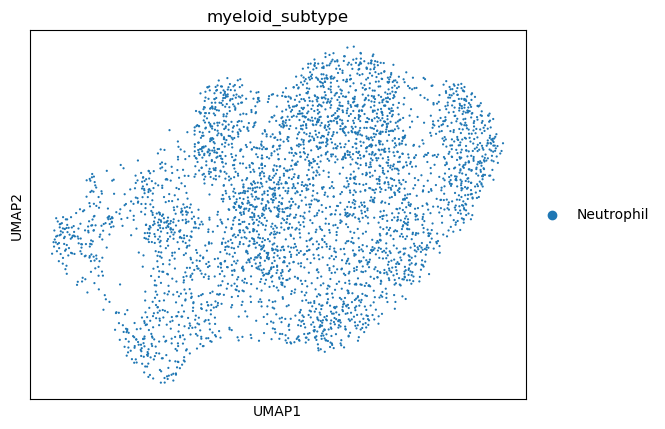

In [16]:
sc.pl.umap(
    adata,
    color="myeloid_subtype",
    size=10)

In [17]:
for res in [0.50, 0.75, 1,1.25]:
    sc.tl.leiden(
        adata, key_added=f"leiden_res_{res:4.2f}", resolution=res, flavor="igraph"
    )

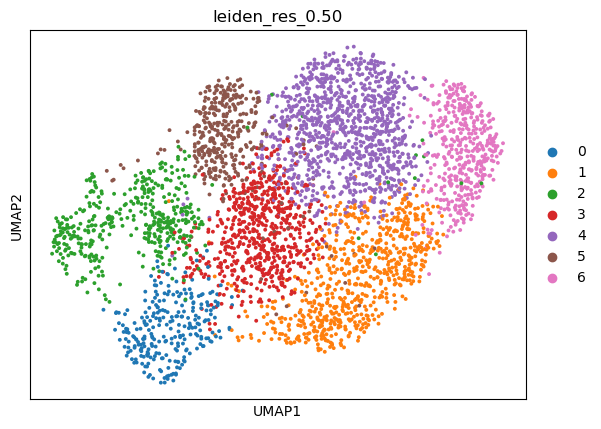

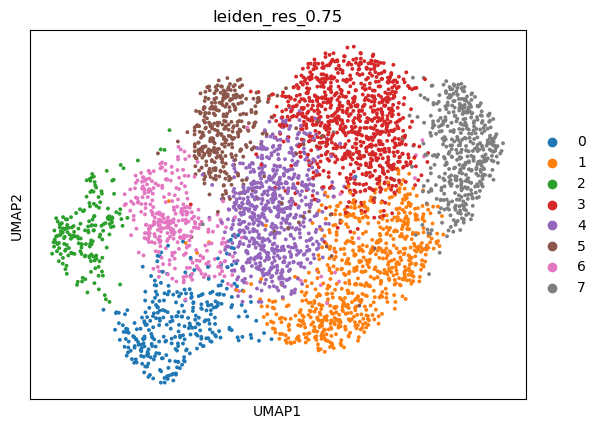

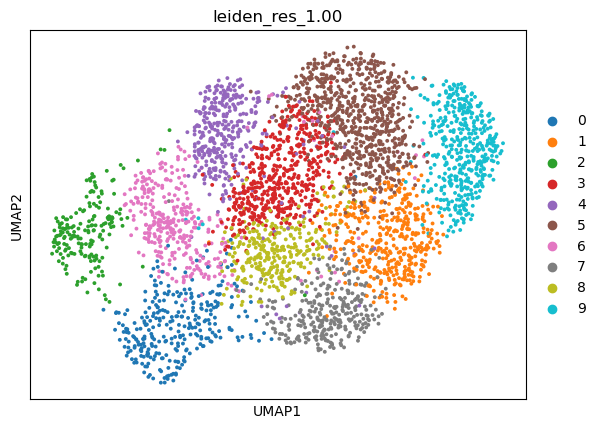

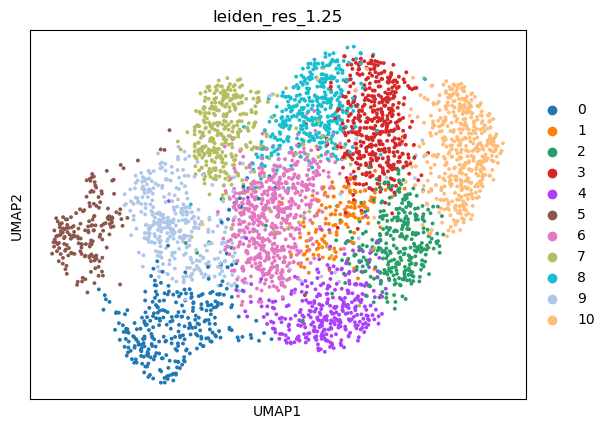

In [18]:
sc.pl.umap(adata, color=["leiden_res_0.50"])
sc.pl.umap(adata, color=["leiden_res_0.75"])
sc.pl.umap(adata, color=["leiden_res_1.00"])
sc.pl.umap(adata, color=["leiden_res_1.25"])

Cluster 0: ['RPLP1', 'RPL41', 'EEF1A1', 'RPS28', 'RPL28', 'RPL39', 'RPS12', 'TMSB10', 'RPL10', 'RPL32', 'RPL30', 'RPL13', 'RPS27A', 'RPS14', 'RPL12', 'RPS19', 'RPL8', 'PTMA', 'RPL19', 'RPS15A']
Cluster 1: ['IL1B', 'SOD2', 'BCL2A1', 'NFKBIA', 'SRGN', 'IL1RN', 'MAILR', 'TNFAIP6', 'G0S2', 'PLAUR', 'AQP9', 'CXCL8', 'CCL4', 'PPP1R15A', 'FTH1', 'TAGAP', 'IL1A', 'GK', 'PNRC1', 'ICAM1']
Cluster 2: ['HCAR3', 'IL1RN', 'PLEK', 'IL1B', 'CXCL8', 'HCAR2', 'SOCS3', 'ZFP36', 'PPIF', 'RHOH', 'SOD2', 'CD44', 'FTH1', 'PPP1R15A', 'GADD45B', 'BCL2A1', 'ENSG00000274213', 'ICAM1', 'NFKBIA', 'OSM']
Cluster 3: ['S100A8', 'S100A9', 'IFITM2', 'ACTB', 'SRGN', 'IL1R2', 'S100A11', 'BASP1', 'H3-3B', 'BCL2A1', 'FTH1', 'S100A6', 'S100A4', 'PROK2', 'SAMSN1', 'RGS2', 'GCA', 'H3-3A', 'S100A12', 'FPR1']
Cluster 4: ['C15orf48', 'CCL3L3', 'SQSTM1', 'CXCL8', 'CCL4L2', 'CCL3', 'FTH1', 'TPI1', 'CD83', 'CCL4', 'SOD2', 'ATP6V0C', 'GAPDH', 'LDHA', 'HIF1A-AS3', 'PI3', 'GADD45B', 'CXCL2', 'CD44', 'TPT1']
Cluster 5: ['MT-CO1', 'MT-A

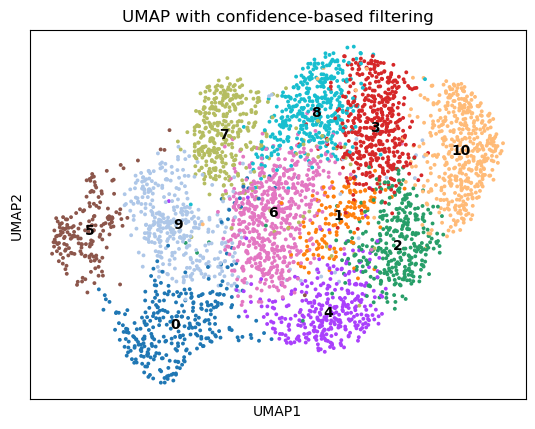

In [19]:
import scanpy as sc
adata.obs['leiden_res_1.25'] = adata.obs['leiden_res_1.25'].astype('category')
sc.tl.rank_genes_groups(adata, groupby='leiden_res_1.25', method='t-test')

top_genes = {}

groups = adata.uns['rank_genes_groups']['names'].dtype.names

for group in groups:
    genes = adata.uns['rank_genes_groups']['names'][group][:20]
    top_genes[group] = genes.tolist()

for cluster, genes in top_genes.items():
    print(f"Cluster {cluster}: {genes}")
sc.pl.umap(
    adata,
    color='leiden_res_1.25',
    title='UMAP with confidence-based filtering',
    legend_loc='on data')

In [20]:
adata = adata.raw.to_adata()

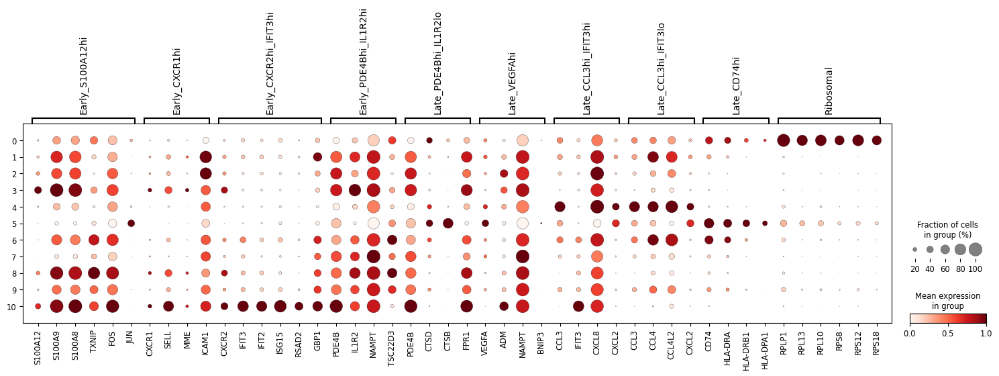

In [21]:
group_markers = {
    "Early_S100A12hi": [
        "S100A12", "S100A9", "S100A8", "TXNIP", "FOS", "JUN"
    ],
    "Early_CXCR1hi": [
        "CXCR1", "SELL", "MME", "ICAM1"
    ],
    "Early_CXCR2hi_IFIT3hi": [
        "CXCR2", "IFIT3", "IFIT2", "ISG15", "RSAD2", "GBP1"
    ],
    "Early_PDE4Bhi_IL1R2hi": [
        "PDE4B", "IL1R2", "NAMPT", "TSC22D3"
    ],
    "Late_PDE4Bhi_IL1R2lo": [
        "PDE4B", "CTSD", "CTSB", "FPR1"
    ],
    "Late_VEGFAhi": [
        "VEGFA", "ADM", "NAMPT", "BNIP3"
    ],
    "Late_CCL3hi_IFIT3hi": [
        "CCL3", "CCL3L1", "IFIT3", "CXCL8", "CXCL2"
    ],
    "Late_CCL3hi_IFIT3lo": [
        "CCL3", "CCL4", "CCL4L2", "CXCL2"
    ],
    "Late_CD74hi": [
        "CD74", "HLA-DRA", "HLA-DRB1", "HLA-DPA1"
    ],
    "Ribosomal": [
        "RPLP1", "RPL13", "RPL10", "RPS8", "RPS12", "RPS18"
    ]
}

existing_genes = {
    k: [g for g in v if g in adata.var_names]
    for k, v in group_markers.items()
}
existing_genes = {k: v for k, v in existing_genes.items() if len(v) > 0}

sc.pl.dotplot(
    adata,
    var_names=existing_genes,
    groupby="leiden_res_1.25",
    standard_scale="var"
)

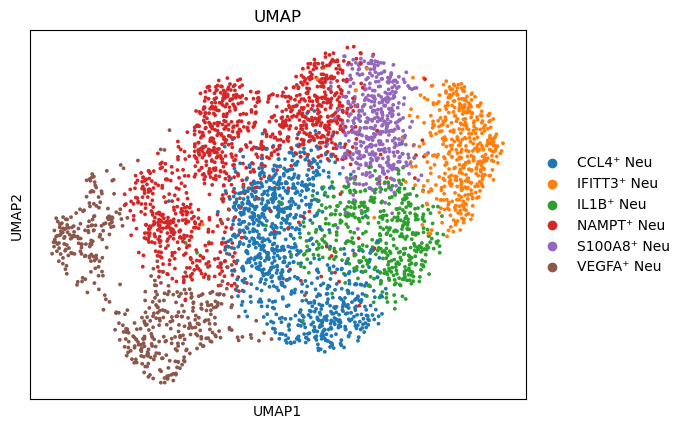

In [22]:
cluster_to_group = {
    0: "VEGFA⁺ Neu",      
    1: "IL1B⁺ Neu",        
    2: "IL1B⁺ Neu",          
    3: "S100A8⁺ Neu",     
    4: "CCL4⁺ Neu",    
    5: "VEGFA⁺ Neu",    
    6: "CCL4⁺ Neu",         
    7: "NAMPT⁺ Neu",     
    8: "NAMPT⁺ Neu",
    9: "NAMPT⁺ Neu",
    10: "IFITT3⁺ Neu"}

adata.obs["test"] = adata.obs["leiden_res_1.25"].astype(int).map(cluster_to_group)

sc.pl.umap(
    adata,
    color='test',
    title='UMAP',
    #legend_loc= False
    s = 30)

In [23]:
import scanpy as sc

sc.tl.rank_genes_groups(adata, groupby='test', method='t-test')

top_genes = {}

groups = adata.uns['rank_genes_groups']['names'].dtype.names

for group in groups:
    genes = adata.uns['rank_genes_groups']['names'][group][:20]
    top_genes[group] = genes.tolist()

for cluster, genes in top_genes.items():
    print(f"Cluster {cluster}: {genes}")

Cluster CCL4⁺ Neu: ['CCL4L2', 'C15orf48', 'CCL4', 'CCL3L3', 'CXCL8', 'CCL3', 'CXCR4', 'FTH1', 'NFKBIA', 'B2M', 'SQSTM1', 'PNRC1', 'MIF', 'TPI1', 'PELATON', 'TMSB4X', 'CD83', 'BRI3', 'SOD2', 'HLA-B']
Cluster IFITT3⁺ Neu: ['IFITM2', 'IFITM1', 'S100A8', 'IFITM3', 'ISG15', 'ACTB', 'LY6E', 'S100A6', 'S100A9', 'MT2A', 'IFIT3', 'IFIT2', 'PDE4B', 'B2M', 'SELL', 'H3-3B', 'PLEK', 'S100A11', 'IFI6', 'SAT1']
Cluster IL1B⁺ Neu: ['IL1B', 'IL1RN', 'CXCL8', 'PLEK', 'SOD2', 'PPIF', 'HCAR3', 'BCL2A1', 'ZFP36', 'PPP1R15A', 'FTH1', 'HCAR2', 'NFKBIA', 'SOCS3', 'ICAM1', 'RHOH', 'CD44', 'PLAU', 'OSM', 'G0S2']
Cluster NAMPT⁺ Neu: ['ELL2', 'NAMPT', 'IRAK3', 'SMCHD1', 'RNF149', 'DOCK5', 'SMAP2', 'MCL1', 'SORL1', 'CAMK1D', 'MXD1', 'SYTL3', 'SSH2', 'MT-CO1', 'SEC14L1', 'CYRIB', 'CELF2', 'NDEL1', 'PTEN', 'PCBP1-AS1']
Cluster S100A8⁺ Neu: ['S100A8', 'S100A9', 'IFITM2', 'ACTB', 'SRGN', 'IL1R2', 'S100A11', 'BASP1', 'H3-3B', 'BCL2A1', 'FTH1', 'S100A6', 'S100A4', 'PROK2', 'SAMSN1', 'RGS2', 'GCA', 'H3-3A', 'S100A12', 'F

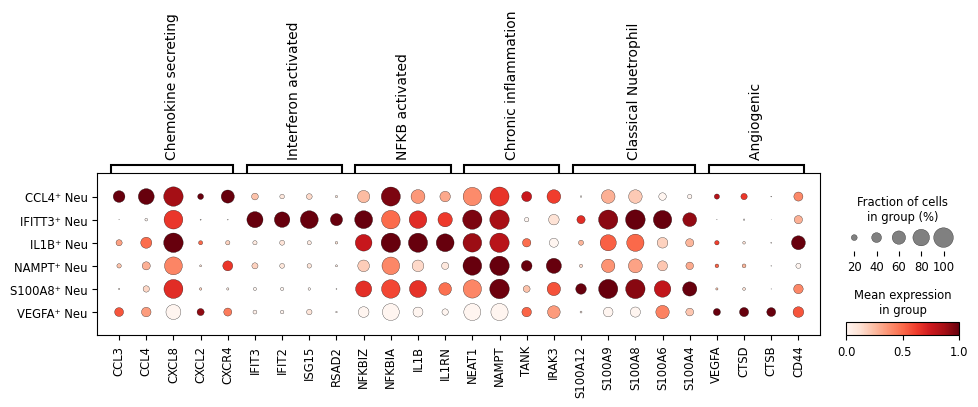

In [24]:
group_markers = {
    "Chemokine secreting":  ["CCL3","CCL4","CXCL8", "CXCL2","CXCR4","CXCR8"],
    "Interferon activated": ["IFIT3", "IFIT2", "ISG15", "RSAD2"],
    "NFKB activated": ["NFKBIZ","NFKBIA","IL1B","IL1RN"],
    "Chronic inflammation": ["NEAT1","NAMPT","TANK","IRAK3"],
    "Classical Nuetrophil": ["S100A12", "S100A9", "S100A8","S100A6","S100A4"],
    "Angiogenic ": ["VEGFA", "CTSD", "CTSB","CD44"],
}


existing_genes = {
    k: [g for g in v if g in adata.var_names]
    for k, v in group_markers.items()
}
existing_genes = {k: v for k, v in existing_genes.items() if len(v) > 0}

sc.pl.dotplot(
    adata,
    var_names=existing_genes,
    groupby="test",
    standard_scale="var"
)

In [25]:
import pandas as pd

save_path = "/home/Data_Drive_8TB/kykim/5. CRC (Myeloid)/Mye_raw_H5ad/neutro_anno.csv"

pd.DataFrame(adata.obs["test"]).to_csv(save_path, index=True)

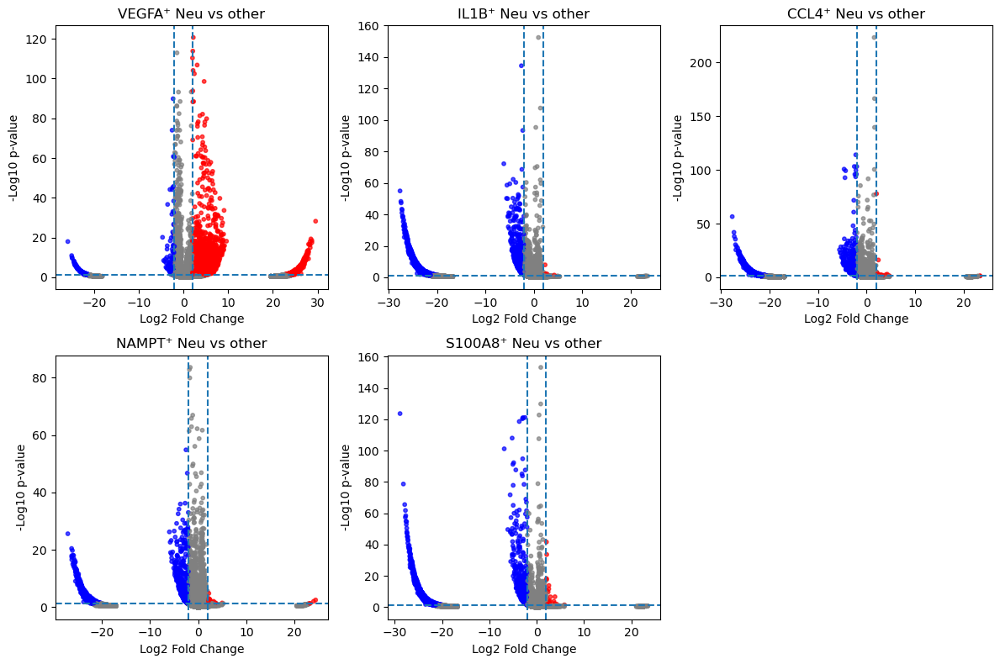

In [102]:
import scanpy as sc
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import ttest_ind

clusters = adata.obs['test'].unique()[:5]

fig, axes = plt.subplots(2, 3, figsize=(12,8))
axes = axes.flatten()

for ax, target_cluster in zip(axes, clusters):
    adata_target = adata[adata.obs['test'] == target_cluster]
    adata_other = adata[adata.obs['test'] != target_cluster]

    X_target = adata_target.X.toarray() if hasattr(adata_target.X, "toarray") else adata_target.X
    X_other = adata_other.X.toarray() if hasattr(adata_other.X, "toarray") else adata_other.X

    mean_target = X_target.mean(axis=0)
    mean_other = X_other.mean(axis=0)

    lfc = np.log2(mean_target + 1e-9) - np.log2(mean_other + 1e-9)

    pvals = np.array([
        ttest_ind(X_target[:, i], X_other[:, i], equal_var=False).pvalue
        for i in range(adata.n_vars)
    ])

    neglog10_pval = -np.log10(pvals + 1e-300)

    colors = np.full(adata.n_vars, "grey", dtype=object)
    colors[(lfc > 2) & (pvals < 0.05)] = "red"
    colors[(lfc < -2) & (pvals < 0.05)] = "blue"

    ax.scatter(lfc, neglog10_pval, c=colors, alpha=0.7, s=10)
    ax.axhline(-np.log10(0.05), linestyle="--")
    ax.axvline(2, linestyle="--")
    ax.axvline(-2, linestyle="--")
    ax.set_title(f"{target_cluster} vs other")
    ax.set_xlabel("Log2 Fold Change")
    ax.set_ylabel("-Log10 p-value")

for ax in axes[len(clusters):]:
    ax.axis("off")

plt.tight_layout()
plt.show()

In [113]:
# sc.pp.normalize_total(adata,target_sum=1e4) 
# sc.pp.log1p(adata)
import pandas as pd
sc.tl.rank_genes_groups(adata, 'test', method="wilcoxon",use_raw =False)
sc.tl.dendrogram(adata, groupby='test')

result = adata.uns["rank_genes_groups"]
groups = result["names"].dtype.names

result_df = pd.DataFrame(
    {
        f"{group}_{key}": result[key][group]
        for group in groups
        for key in ["names", "pvals_adj", "logfoldchanges", "scores"]
    })
up_dict = {}
down_dict = {}

for group in groups:
    n_col = f"{group}_names"
    p_col = f"{group}_pvals_adj"
    l_col = f"{group}_logfoldchanges"
    s_col = f"{group}_scores"

    degs_sig = result_df[result_df[p_col] < 0.05]
    degs_up = degs_sig[degs_sig[l_col] > 1].sort_values(by=s_col, ascending=False)
    degs_dw = degs_sig[degs_sig[l_col] < -1].sort_values(by=s_col, ascending=True)
    up_dict[group] = degs_up[n_col].reset_index(drop=True)
    down_dict[group] = degs_dw[n_col].reset_index(drop=True)

df_merge_up = pd.concat(up_dict.values(), axis=1)
df_merge_up.columns = list(up_dict.keys())

df_merge_down = pd.concat(down_dict.values(), axis=1)
df_merge_down.columns = list(down_dict.keys())

sc.tl.dendrogram(adata, groupby='test')

result = adata.uns["rank_genes_groups"]
groups = result["names"].dtype.names
result_df = pd.DataFrame(
    {
        f"{group}_{key}": result[key][group]
        for group in groups
        for key in ["names", "pvals_adj", "logfoldchanges", "scores"]
    }
)
up_dict = {}
down_dict = {}

for group in groups:
    n_col = f"{group}_names"
    p_col = f"{group}_pvals_adj"
    l_col = f"{group}_logfoldchanges"
    s_col = f"{group}_scores"
    degs_sig = result_df[result_df[p_col] < 0.05]
    degs_up = degs_sig[degs_sig[l_col] > 1].sort_values(by=s_col, ascending=False)
    degs_dw = degs_sig[degs_sig[l_col] < -1].sort_values(by=s_col, ascending=True)
    up_dict[group] = degs_up[n_col].reset_index(drop=True)
    down_dict[group] = degs_dw[n_col].reset_index(drop=True)

df_merge_up = pd.concat(up_dict.values(), axis=1)
df_merge_up.columns = list(up_dict.keys())

df_merge_down = pd.concat(down_dict.values(), axis=1)
df_merge_down.columns = list(down_dict.keys())
import sys
sys.path.append("/home/Data_Drive_8TB/kykim/QED")
from qed.data import readtxt, readseurat, readscanpy
from qed.data import get_enrichment_dataframes
from qed.data import merge_df
from qed.data import query
import inspect

import pandas as pd
class GeneSet:
    def __init__(self, genes, name, annot=None):
        self.genes = genes
        self.name = name
        self.params = {}
        self.GO = []
        self.annot = annot or {}
dblist = [
    'KEGG_2021_Human',
    'Reactome_2022', 'Mouse_Gene_Atlas',
    'MSigDB_Hallmark_2020',
    'GO_Biological_Process_2023',
    'WikiPathway_2024_Human','WikiPathways_2024_Mouse','KEGG_2019_Mouse']

df_merge_up_100 = df_merge_up.head(20)
df_merge_up_100.to_csv('breast_cancer_DEG_up_leiden.csv', index=False, header=True)

alist = pd.read_csv('breast_cancer_DEG_up_leiden.csv')
geneset_list = []
for col in alist.columns:
    genes = alist[col].dropna().tolist()
    gs = GeneSet(genes=genes, name=col, annot={"Leiden": col})
    geneset_list.append(gs)

aalist = get_enrichment_dataframes(
    geneset_list=geneset_list,
    dblist=dblist,
    annot_colname="Leiden",
    n_jobs=None,
    handle_error=True,
    max_iter=1
)

df = merge_df(aalist)
df['Term'] = df['Term'].str.split(r'\(GO:').str[0].str.strip()
df['Term'] = df['Term'].str.split('R-H').str[0].str.strip()
df['Term'] = df['Term'].str.split('WP').str[0].str.strip()

Processing genesets: 8it [00:01,  7.81it/s]                       

Error processing IL1B⁺ Neu for WikiPathway_2024_Human: 'WikiPathway_2024_Human'
Error processing NAMPT⁺ Neu for WikiPathway_2024_Human: 'WikiPathway_2024_Human'
Error processing IFITT3⁺ Neu for WikiPathway_2024_Human: 'WikiPathway_2024_Human'
Status code: 400
Response content: b'<!DOCTYPE html>\n<html lang="en">\n<head>\n\t<title>Enrichr</title>\n\t<meta http-equiv="Content-Type" content="text/html;charset=UTF-8">\n\t<meta name="author" content="Edward Y. Chen"/>\n\t<meta name="viewport" content="width=750">\n\t<link rel="shortcut icon" type="image/x-icon" href="favicon.ico"/>\n\t<link rel="icon" type="image/ico" href="favicon.ico"/>\n\t<link rel="stylesheet" type="text/css" href="css/reset-min.css"/>\n\t<link href=\'https://fonts.googleapis.com/css?family=Droid+Sans\' rel=\'stylesheet\' type=\'text/css\'/>\n\t<link rel="stylesheet" type="text/css" href="css/common.css"/>\n\t<link rel="stylesheet" type="text/css" href="css/login.css"/>\n</head>\n<body>\n\t<div id="logo">\n\t\t<a href="

Processing genesets: 39it [00:02, 19.21it/s]

Error processing S100A8⁺ Neu for WikiPathway_2024_Human: 'WikiPathway_2024_Human'
Status code: 400
Response content: b'<!DOCTYPE html>\n<html lang="en">\n<head>\n\t<title>Enrichr</title>\n\t<meta http-equiv="Content-Type" content="text/html;charset=UTF-8">\n\t<meta name="author" content="Edward Y. Chen"/>\n\t<meta name="viewport" content="width=750">\n\t<link rel="shortcut icon" type="image/x-icon" href="favicon.ico"/>\n\t<link rel="icon" type="image/ico" href="favicon.ico"/>\n\t<link rel="stylesheet" type="text/css" href="css/reset-min.css"/>\n\t<link href=\'https://fonts.googleapis.com/css?family=Droid+Sans\' rel=\'stylesheet\' type=\'text/css\'/>\n\t<link rel="stylesheet" type="text/css" href="css/common.css"/>\n\t<link rel="stylesheet" type="text/css" href="css/login.css"/>\n</head>\n<body>\n\t<div id="logo">\n\t\t<a href="index.html"><img src="images/enrichr-icon.png"/><span>En</span><span class="red">rich</span><span>r</span></a>\n\t</div>\n\t<div class="clear"></div>\n\t<div id=

Processing genesets: 48it [00:02, 17.19it/s]


Trying to re-request...
Error processing CCL4⁺ Neu for WikiPathway_2024_Human: 'WikiPathway_2024_Human'
CCL4⁺ Neu with WikiPathway_2024_Human completed!
Error processing IFITT3⁺ Neu for WikiPathway_2024_Human: 'WikiPathway_2024_Human'
IFITT3⁺ Neu with WikiPathway_2024_Human completed!
Error processing IL1B⁺ Neu for WikiPathway_2024_Human: 'WikiPathway_2024_Human'
IL1B⁺ Neu with WikiPathway_2024_Human completed!
NAMPT⁺ Neu with KEGG_2021_Human completed!
Error processing NAMPT⁺ Neu for WikiPathway_2024_Human: 'WikiPathway_2024_Human'
NAMPT⁺ Neu with WikiPathway_2024_Human completed!
Error processing S100A8⁺ Neu for WikiPathway_2024_Human: 'WikiPathway_2024_Human'
S100A8⁺ Neu with WikiPathway_2024_Human completed!
S100A8⁺ Neu with KEGG_2019_Mouse completed!
Error processing VEGFA⁺ Neu for WikiPathway_2024_Human: 'WikiPathway_2024_Human'
VEGFA⁺ Neu with WikiPathway_2024_Human completed!


In [114]:
from typing import List, Tuple, Dict
def heatmap_with_groupwise_ordering(df: pd.DataFrame,
                                     n: int,
                                     group_by: str,
                                     order_by: str = "Adjusted p-value",
                                     cmap: str = 'Blues',
                                     xlabel_rotation: int = 90,
                                     xlabel_fontsize: int = 15,
                                     ylabel_fontsize: int = 15,
                                     figsize: Tuple = (15, 10),
                                     vmin: float = None,
                                     vmax: float = None,
                                     cbar_kws: Dict = None,
                                     linewidths: float = 0.1,
                                     title: str = None,
                                     save_to_file: str = None,
                                     enable_column_order: bool = False,
                                     column_order: list = None,
                                     enable_highlight_columns: bool = False,
                                     highlight_column_names: list = None):

    if not isinstance(df, pd.DataFrame):
        raise TypeError("입력 'df'는 pandas DataFrame이어야 합니다.")
    if group_by not in df.columns:
        raise ValueError(f"'{group_by}' 컬럼이 DataFrame에 존재하지 않습니다.")
    if order_by not in df.columns:
        raise ValueError(f"'{order_by}' 컬럼이 DataFrame에 존재하지 않습니다.")
    if 'Term' not in df.columns:
        raise ValueError("'Term' 컬럼이 DataFrame에 존재하지 않습니다.")

    has_overlapping_genes = 'Overlapping genes' in df.columns

    # P-value 컬럼 숫자형 강제 변환
    df_copy = df.copy()
    df_copy[order_by] = pd.to_numeric(df_copy[order_by], errors='coerce')
    df = df_copy

    df['Term_lower'] = df['Term'].str.lower()

    # 상위 n개 Term 추출
    df_filtered_by_order = df[df[order_by].notna()]
    df_ranked_per_group = (
        df_filtered_by_order
        .sort_values(order_by)
        .groupby(group_by)
        .head(n)
        .reset_index(drop=True)
    )
    if df_ranked_per_group.empty:
        print(f"⚠️ 각 그룹에서 상위 {n}개의 Term을 선택할 수 없습니다.")
        return None, None

    all_selected_terms_lower = df_ranked_per_group['Term_lower'].unique()

    # Overlapping genes 처리
    overlapping_genes_pivot = pd.DataFrame()
    if has_overlapping_genes:
        overlapping_genes_df = df[df['Term_lower'].isin(all_selected_terms_lower)][['Term_lower', group_by, 'Overlapping genes']]
        overlapping_genes_df['Overlapping genes'] = overlapping_genes_df['Overlapping genes'].apply(
            lambda x: ', '.join(map(str, x)) if isinstance(x, list) else str(x)
        )
        overlapping_genes_df = overlapping_genes_df.groupby(['Term_lower', group_by])['Overlapping genes'].apply(', '.join).reset_index()
        overlapping_genes_df.rename(columns={'Term_lower': 'Term'}, inplace=True)
        overlapping_genes_pivot = overlapping_genes_df.pivot(index='Term', columns=group_by, values='Overlapping genes').fillna('')
        overlapping_genes_pivot.index = overlapping_genes_pivot.index.map(lambda x: x.capitalize())

    # P-value pivot table
    aggregated_df = df[df['Term_lower'].isin(all_selected_terms_lower)].groupby(['Term_lower', group_by], as_index=False)[order_by].min()
    aggregated_df.rename(columns={'Term_lower': 'Term'}, inplace=True)
    pivot_df = aggregated_df.pivot(index="Term", columns=group_by, values=order_by).fillna(1).rename_axis(None, axis=1)

    # Log 변환
    is_pvalue_column = order_by.lower() in ['adjusted p-value', 'p-value']
    pivot_df_for_heatmap = -np.log10(np.maximum(pivot_df, np.finfo(float).eps)) if is_pvalue_column else pivot_df.copy()
    pivot_df_for_heatmap.index = pivot_df_for_heatmap.index.map(lambda x: x.capitalize())

    # ✅ Overlapping genes와 결합
    final_pivot_df = pd.concat([pivot_df_for_heatmap, overlapping_genes_pivot], axis=1)

    if save_to_file:
        try:
            final_pivot_df.to_csv(save_to_file, encoding='utf-8-sig')
            print(f"✅ 히트맵 데이터 저장 완료: '{save_to_file}'")
        except Exception as e:
            print(f"❌ 저장 실패: {e}")

    # ✅ column_order 기준 row 정렬
    row_order = []
    seen_terms = set()

    if enable_column_order and column_order:
        group_order_for_plot = [group for group in column_order if group in df[group_by].unique()]
    else:
        group_order_for_plot = sorted(df[group_by].unique())  # ✅ X축 정렬에 맞춤

    # 🔑 Y축을 X축 순서에 맞춰 계단식으로 GO term 배치
    for group in group_order_for_plot:
        current_group_terms = (
            df_ranked_per_group[df_ranked_per_group[group_by] == group]
            .sort_values(order_by)
        )
        for term_lower_val in current_group_terms['Term_lower']:
            capitalized_term = term_lower_val.capitalize()
            if capitalized_term in pivot_df_for_heatmap.index and capitalized_term not in seen_terms:
                row_order.append(capitalized_term)
                seen_terms.add(capitalized_term)

    # row_order 적용
    clustered_data = final_pivot_df.loc[row_order]
    heatmap_data = clustered_data.select_dtypes(include=[np.number])
   # 1️⃣ 사용자 지정 column_order가 있으면 그 순서 적용
    if enable_column_order and column_order:
        valid_cols = [c for c in column_order if c in heatmap_data.columns]
        if valid_cols:
            heatmap_data = heatmap_data[valid_cols]

# 2️⃣ column_order가 없고, 열 이름이 전부 숫자로 해석 가능하면 오름차순 정렬
    else:
        try:
        # 모든 열 이름을 float으로 바꿔 보고 성공하면 오름차순 재정렬
            numeric_col_keys = [float(c) for c in heatmap_data.columns]
            sorted_cols = [col for _, col in sorted(zip(numeric_col_keys, heatmap_data.columns))]
            heatmap_data = heatmap_data[sorted_cols]
        except ValueError:
        # 열 이름이 숫자가 아닌 게 섞여 있으면 그대로 둡니다
            pass


    if is_pvalue_column:
        p_values_for_annotation = 10 ** (-np.clip(heatmap_data, None, 300))
        annotations = np.where(p_values_for_annotation <= 0.05, '*', '')
        annotations = annotations.astype(object)
    else:
        annotations = False

    # ✅ 열 강조 인덱스 계산 (선 추가)
    highlight_column_indices = []
    if enable_highlight_columns and highlight_column_names:
        highlight_column_indices = [
            list(heatmap_data.columns).index(col)
            for col in highlight_column_names if col in heatmap_data.columns
        ]

    # ✅ 시각화
    fig, ax = plt.subplots(figsize=figsize)
    sns.heatmap(heatmap_data, cmap=cmap, vmin=vmin, vmax=vmax,
                linewidths=linewidths, annot=annotations, fmt='',
                linecolor='white', ax=ax, cbar_kws=cbar_kws, square=True,
                annot_kws={"size": 12, "color": "white", "weight": "bold"})

    # 수직선 추가
    for x in highlight_column_indices:
        ax.vlines(x + 1, *ax.get_ylim(), colors='black', linewidth=2)

    plt.xticks(rotation=xlabel_rotation, fontsize=xlabel_fontsize)
    plt.yticks(fontsize=ylabel_fontsize)
    if title:
        ax.set_title(title, fontsize=18, pad=20)
    plt.grid(False)

    if 'Term_lower' in df.columns:
        df.drop(columns='Term_lower', inplace=True)

    return fig, ax

In [120]:
terms = [
    "Cellular Responses To Stimuli",
    "Cellular Response To Epidermal Growth Factor Stimulus",
    "Negative Regulation Of Immune Effector Process"
]

df_filtered = df[
    (df["Leiden"] != "VEGFA⁺ Neu") |
    ((df["Leiden"] == "VEGFA⁺ Neu") & (df["Term"].isin(terms)))
]


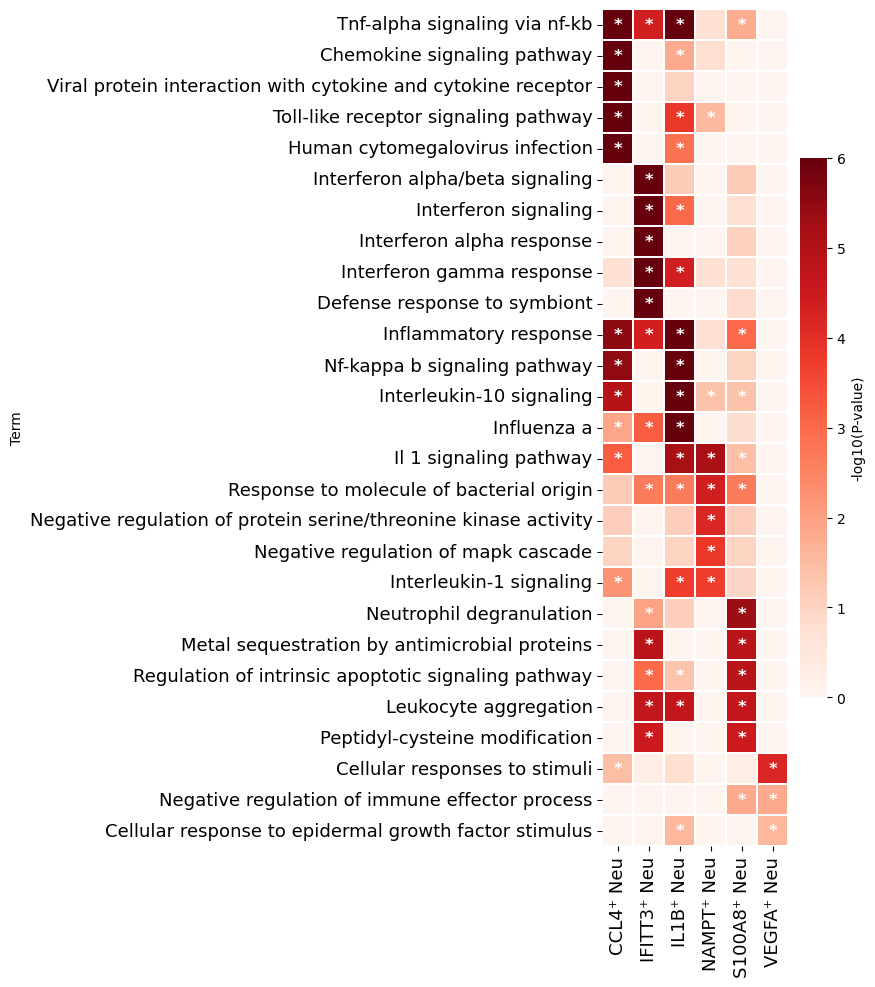

In [121]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

fig, ax = heatmap_with_groupwise_ordering(
    df= df_filtered,
    n=5,
    group_by='Leiden',
    order_by="P-value",
    cmap='Reds',
    xlabel_rotation=90,
    xlabel_fontsize=13,
    ylabel_fontsize=13,
    figsize=(3, 14),
    vmin=0, vmax=6,
    cbar_kws={'shrink': 0.5, 'label': '-log10(P-value)'},
    enable_column_order=False,
   # column_order=[
   #     "Contractile cardiomyocyte", 
   #     "Myogenerative cardiomyocyte", 
   #     "Inflammatory cardiomyocyte"
   # ],
    enable_highlight_columns=False,
   # highlight_column_names=[
   #     "Contractile cardiomyocyte", 
   #     "Inflammatory cardiomyocyte"
   # ]
)

<Figure size 800x500 with 0 Axes>

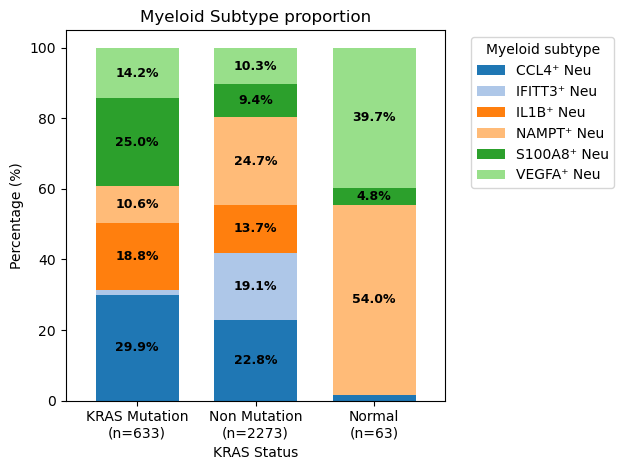

In [124]:
import pandas as pd
import matplotlib.pyplot as plt
adata.obs['KRAS_mutation'] = adata.obs['KRAS'].apply(lambda x: "Non Mutation" if x == "-" else "KRAS Mutation")
adata.obs.loc[adata.obs['Is_tumor'] == "Normal", 'KRAS_mutation'] = "Normal"
counts = pd.crosstab(adata.obs['KRAS_mutation'], adata.obs['test'])
percentage = counts.div(counts.sum(axis=1), axis=0) * 100

colors = plt.cm.tab20.colors
plt.figure(figsize=(8,5))
ax = percentage.plot(kind='bar', stacked=True, color=colors, width=0.7)

plt.ylabel("Percentage (%)")
plt.xlabel("KRAS Status")
plt.title("Myeloid Subtype proportion")
plt.legend(title='Myeloid subtype', bbox_to_anchor=(1.05, 1), loc='upper left')
total_counts = counts.sum(axis=1)
xticks_labels = [f"{kr}\n(n={total_counts[kr]})" for kr in counts.index]
ax.set_xticklabels(xticks_labels, rotation=0)
for i, (idx, row) in enumerate(percentage.iterrows()):
    cumulative = 0
    for j, value in enumerate(row):
        if value > 3:
            ax.text(
                i, cumulative + value / 2,
                f"{value:.1f}%",
                ha='center', va='center', color='black', fontsize=9, fontweight='bold'
            )
        cumulative += value

plt.tight_layout()
plt.show()

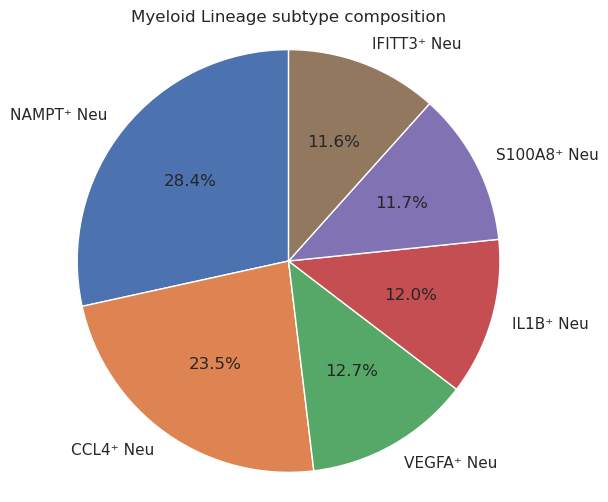

In [126]:
import matplotlib.pyplot as plt

counts = adata.obs['test'].value_counts()

plt.figure(figsize=(6,6))
plt.pie(
    counts.values,
    labels=counts.index,
    autopct='%1.1f%%',
    startangle=90
)
plt.axis('equal')
plt.title('Myeloid Lineage subtype composition')
plt.show()

In [30]:
save_path = "/home/Data_Drive_8TB/kykim/5. CRC (Myeloid)/Mye_raw_H5ad/myeoloid_raw_data.h5ad"

adata.write(save_path)